In [1]:
# !pip install polars

In [2]:
# !pip install arch

In [3]:
# !pip install hmmlearn

In [4]:
# !pip install pmdarima

In [5]:
import polars as pl
import numpy as np
import math

from IPython.display import display
from pathlib import Path

import matplotlib.pyplot as plt
from plotly.subplots import make_subplots
import plotly.express as px
import plotly.graph_objects as go

from sklearn.model_selection import train_test_split
from arch import arch_model
from sklearn.metrics import mean_absolute_error
import scipy.stats as stats

import statsmodels.api as sm
from hmmlearn.hmm import GaussianHMM
from statsmodels.tsa.stattools import adfuller, acf, pacf, kpss
from statsmodels.stats.diagnostic import het_arch
# from pmdarima.arima import ndiffs, nsdiffs
# from scipy.stats import jarque_bera, boxcox
# from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

import datetime as dt
import yfinance as yf

# import warnings
# warnings.filterwarnings('ignore')

In [6]:
# data =\
#     pl.read_csv('data.csv')

# data =\
# (
#     data.with_columns(
#         ((pl.col('best_bid') + pl.col('best_offer')) / 2)
#         .alias('mid'),
#         (pl.col('strike_price') * 0.001)
#         .alias('strike')
#     )
# )
# data

In [7]:
def init_data():

    start = dt.datetime(1993, 1, 1)
    end = dt.datetime(2024, 1, 1)

    spx =\
    (
        pl.DataFrame(
            yf.download(
                ['^SPX'],
                start = start,
                end = end
            )[['Open', 'High', 'Low', 'Close']]
            .reset_index()
        )
    )

    spx =\
    (
        spx.with_columns(       
            np.log(pl.col('Close') / pl.col('Close').shift())
            .alias('log_ret')
        )
    )

    vix =\
    (
        pl.DataFrame(
            yf.download(
                ['^VIX'],
                start = start,
                end = end
            )['Close']
            .reset_index()
        )
    )

    
    ret = spx.select(['Date', 'log_ret']).drop_nulls()

    train_ret, test_ret =\
    train_test_split(
        ret,
        test_size = 0.2,
        shuffle = False
    )

    return spx, vix, ret, train_ret, test_ret

In [8]:
spx, vix, ret, train_ret, test_ret = init_data()

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


In [9]:
def plot_data(spx, ret):
     
    fig = make_subplots(rows = 2, cols = 1, shared_xaxes = True, vertical_spacing = 0.1, subplot_titles = ('SPX', 'Log Returns'))

    plt_spx = go.Scatter(x = spx['Date'], y = spx['Close'])
    plt_ret = go.Scatter(x = ret['Date'], y = ret['log_ret'])

    fig.add_trace(plt_spx, row=1, col=1)
    fig.add_trace(plt_ret, row=2, col=1)
    
    fig.update_xaxes(range=[ret['Date'].min(), ret['Date'].max()], row=2, col=1)
    fig.update_xaxes(title_text = 'Date', row=2, col=1)
    
    fig.update_layout(height = 800, title_text = "SPX & SPX Log Returns", showlegend = False, hovermode = "x unified")
    fig.update_traces(xaxis='x1')
    fig.show()

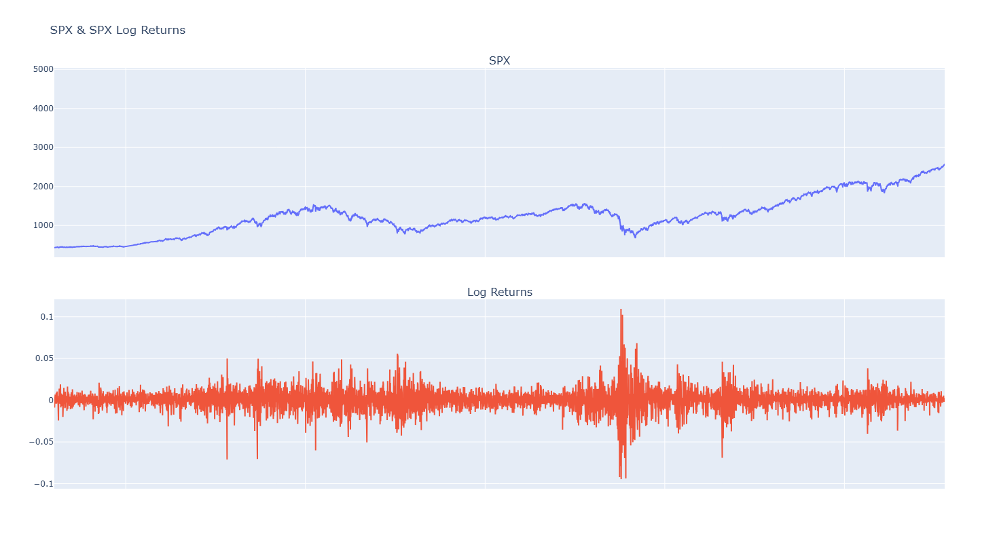

In [10]:
plot_data(spx, train_ret)

In [11]:
def garman_klass(price_data, window=30, trading_periods=252, clean=True):

    log_hl = np.log(price_data["High"] / price_data["Low"])
    log_co = np.log(price_data["Close"] / price_data["Open"])

    rs = 0.5 * log_hl ** 2 - (2 * math.log(2) - 1) * log_co ** 2

    def f(v):
        return (trading_periods * v.mean()) ** 0.5

    result = rs.rolling_map(f, window_size=window)

    if clean:
        return result.drop_nulls()
    else:
        return result

In [56]:
garman_klass_vol = garman_klass(spx)

def plot(df, title = 'title'):
    fig = go.Figure()
    fig.add_trace(go.Scatter(
            x= spx['Date'],
            y= df,
    ))
    fig.update_layout(
            title=title,
            height=500,
            showlegend = False
    )
    fig.show()

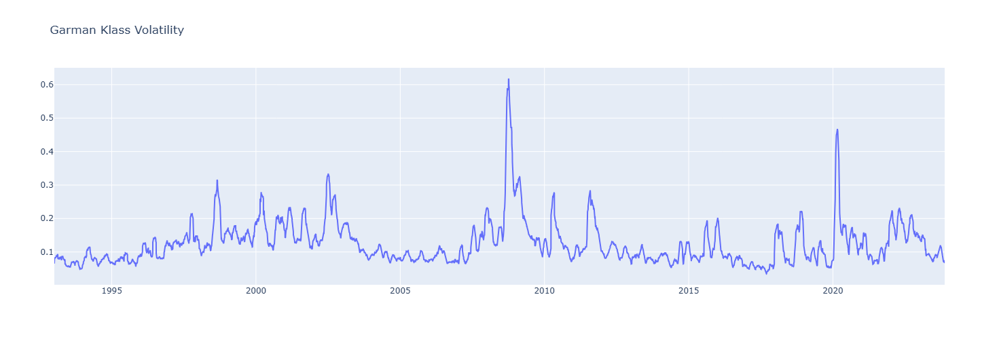

In [57]:
plot(garman_klass_vol, 'Garman Klass Volatility')

In [14]:
def plot_acf_pacf(df, confint, title):
    lower_bound = confint[1:, 0] - df[1:]
    upper_bound = confint[1:, 1] - df[1:]
    fig = go.Figure()
    fig.add_trace(go.Bar(
        width = 0.3,
        x= np.arange(len(df)),
        y= df_pacf,
        name= 'PACF',
        ))
    fig.add_trace(go.Scatter(
        x= np.arange(len(df)),
        y= upper_bound,
        name= 'Upper Confidence Interval',
        line_color='#75bbfd'
        ))
    fig.add_trace(go.Scatter(
        x= np.arange(len(df)),
        y= lower_bound,
        name= 'Lower Confidence Interval',
        line_color='#75bbfd'
        ))
    fig.update_layout(
        title=title,
        xaxis_title="Lag",
        yaxis_title="Autocorrelation",
        height=500,
        showlegend = False
        )
    fig.show()

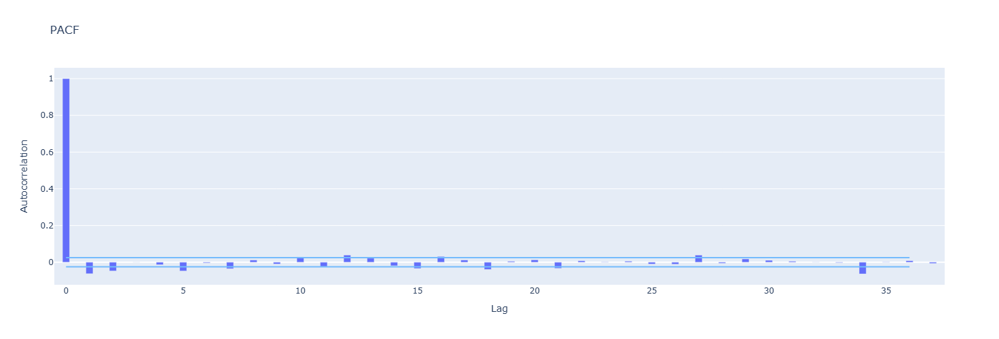

In [15]:
df_pacf, confint_pacf = pacf(train_ret['log_ret'], alpha = 0.05)
plot_acf_pacf(df_pacf, confint_pacf, 'PACF')

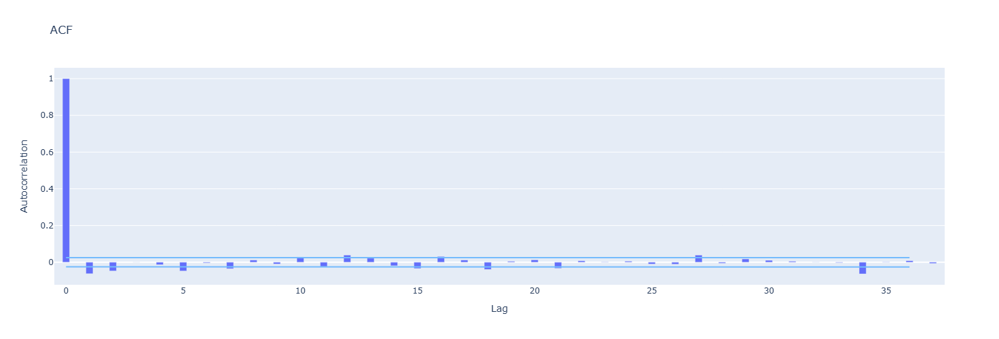

In [16]:
df_acf, confint_acf = acf(train_ret['log_ret'], alpha = 0.05)
plot_acf_pacf(df_acf, confint_acf, 'ACF')

In [17]:
# Augmented Dickey-Fuller Test

adfuller(train_ret['log_ret'])

(-14.066437070147986,
 2.9929135903727855e-26,
 33,
 6209,
 {'1%': -3.4314036327194968,
  '5%': -2.8620056116849666,
  '10%': -2.567017842230278},
 -37998.90274415197)

#### Augmented Dickey-Fuller Test (adfuller)
> H_0: The time series is not stationary; It has some time-dependent srtucture and deos not have constant variance over time.
>
> H_A: The time series is stationary.

`p-value` = 2.553655426774718e-19

> Since `p-value` is less than the 1% significance level (0.01), we reject the null hypothesis. Therefore the time series is stationary.

In [18]:
# KPSS Test

kpss(train_ret['log_ret'], regression='ct')

(0.1285754634161257,
 0.08226766034050798,
 22,
 {'10%': 0.119, '5%': 0.146, '2.5%': 0.176, '1%': 0.216})

#### KPSS Test
> H_0: The time series is trend stationary.
>
> H_A: The time series is not trend stationary.

`KPSS Test Statistic` = 0.0385228709806981

`p-value` = 0.1

`Truncation Lag Parameter` = 1

> Since `p-value` is not more than the 5% significance level, we fail to reject the null hypothesis. Therefore the time series is trend stationary.

In [19]:
def return_dist_stats(df):

    df = pl.Series(df)

    plt = px.histogram(df.to_numpy(), marginal= "violin")

    plt.show()

    print('Length of the return series:', df.shape[0])
    print('Mean:', df.mean())
    print('Standard Deviation:', df.std())
    print('Skew:', df.skew())
    print('Kurtosis:', df.kurtosis())

    display(df.describe())

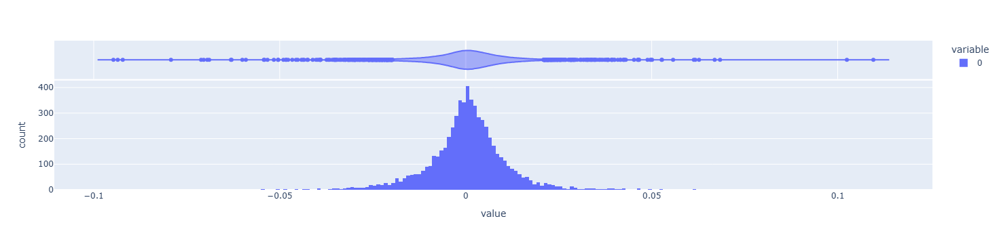

Length of the return series: 6243
Mean: 0.0002836170064227568
Standard Deviation: 0.011398641785902806
Skew: -0.25896975838857966
Kurtosis: 8.946464102377897


statistic,value
str,f64
"""count""",6243.0
"""null_count""",0.0
"""mean""",0.000284
"""std""",0.011399
"""min""",-0.094695
"""25%""",-0.004488
"""50%""",0.000549
"""75%""",0.0056
"""max""",0.109572


In [20]:
return_dist_stats(train_ret['log_ret'])

In [21]:
def return_dist_stats(df):

    df = pl.Series(df)

    plt = px.histogram(df.to_numpy(), marginal= "violin")

    plt.show()

    print('Length of the return series:', df.shape[0])
    print('Mean:', df.mean())
    print('Standard Deviation:', df.std())
    print('Skew:', df.skew())
    print('Kurtosis:', df.kurtosis())

    display(df.describe())

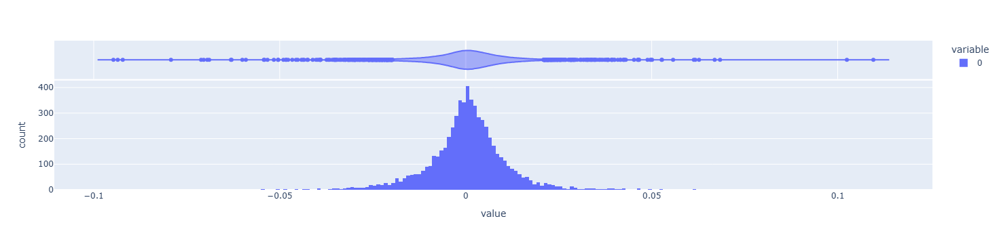

Length of the return series: 6243
Mean: 0.0002836170064227568
Standard Deviation: 0.011398641785902806
Skew: -0.25896975838857966
Kurtosis: 8.946464102377897


statistic,value
str,f64
"""count""",6243.0
"""null_count""",0.0
"""mean""",0.000284
"""std""",0.011399
"""min""",-0.094695
"""25%""",-0.004488
"""50%""",0.000549
"""75%""",0.0056
"""max""",0.109572


In [22]:
return_dist_stats(train_ret['log_ret'])

In [23]:
def model_garch(df, date):
    
    mod = arch_model(df, mean = 'Zero', vol = 'Garch', p=1, o=0, q=1, rescale = False)
    res = mod.fit()
    vol = pl.DataFrame({'Date': date, 'vol': res.conditional_volatility})

    return mod, res, vol

In [24]:
mod_garch, res_garch, vol_garch = model_garch(train_ret['log_ret'], train_ret['Date'])
res_garch.summary()

Iteration:      1,   Func. Count:      4,   Neg. LLF: -20432.680275998377
Optimization terminated successfully    (Exit mode 0)
            Current function value: -20432.68029702547
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1


<class 'statsmodels.iolib.summary.Summary'>
"""
                       Zero Mean - GARCH Model Results                        
==============================================================================
Dep. Variable:                      y   R-squared:                       0.000
Mean Model:                 Zero Mean   Adj. R-squared:                  0.000
Vol Model:                      GARCH   Log-Likelihood:                20432.7
Distribution:                  Normal   AIC:                          -40859.4
Method:            Maximum Likelihood   BIC:                          -40839.1
                                        No. Observations:                 6243
Date:                Wed, Nov 06 2024   Df Residuals:                     6243
Time:                        15:03:39   Df Model:                            0
                              Volatility Model                              
============================================================================
                 coef    std err          t      P>|t|      95.0% Conf. Int.
----------------------------------------------------------------------------
omega      2.5998e-06  2.193e-11  1.185e+05      0.000 [2.600e-06,2.600e-06]
alpha[1]       0.1000  9.258e-03     10.802  3.378e-27   [8.186e-02,  0.118]
beta[1]        0.8800  6.057e-03    145.295      0.000     [  0.868,  0.892]
============================================================================

Covariance estimator: robust
"""

In [25]:
res_garch.arch_lm_test()

ARCH-LM Test
H0: Residuals are homoskedastic.
ARCH-LM Test
H1: Residuals are conditionally heteroskedastic.
Statistic: 1918.0919
P-value: 0.0000
Distributed: chi2(34)
WaldTestStatistic, id: 0x21322c2a2d0

In [26]:
# Jarque Bera Test

stats.jarque_bera(res_garch.conditional_volatility)

SignificanceResult(statistic=76736.48889043984, pvalue=0.0)

In [27]:
def model_garch(df, date):
    
    mod = arch_model(df, mean = 'Zero', vol = 'Garch', p=1, o=0, q=1, rescale = False)
    res = mod.fit()
    vol = pl.DataFrame({'Date': date, 'vol': res.conditional_volatility})

    return mod, res, vol

In [28]:
mod_garch, res_garch, vol_garch = model_garch(train_ret['log_ret'], train_ret['Date'])
res_garch.summary()

Iteration:      1,   Func. Count:      4,   Neg. LLF: -20432.680275998377
Optimization terminated successfully    (Exit mode 0)
            Current function value: -20432.68029702547
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1


<class 'statsmodels.iolib.summary.Summary'>
"""
                       Zero Mean - GARCH Model Results                        
==============================================================================
Dep. Variable:                      y   R-squared:                       0.000
Mean Model:                 Zero Mean   Adj. R-squared:                  0.000
Vol Model:                      GARCH   Log-Likelihood:                20432.7
Distribution:                  Normal   AIC:                          -40859.4
Method:            Maximum Likelihood   BIC:                          -40839.1
                                        No. Observations:                 6243
Date:                Wed, Nov 06 2024   Df Residuals:                     6243
Time:                        15:03:39   Df Model:                            0
                              Volatility Model                              
============================================================================
                 coef    std err          t      P>|t|      95.0% Conf. Int.
----------------------------------------------------------------------------
omega      2.5998e-06  2.193e-11  1.185e+05      0.000 [2.600e-06,2.600e-06]
alpha[1]       0.1000  9.258e-03     10.802  3.378e-27   [8.186e-02,  0.118]
beta[1]        0.8800  6.057e-03    145.295      0.000     [  0.868,  0.892]
============================================================================

Covariance estimator: robust
"""

In [29]:
res_garch.arch_lm_test()

ARCH-LM Test
H0: Residuals are homoskedastic.
ARCH-LM Test
H1: Residuals are conditionally heteroskedastic.
Statistic: 1918.0919
P-value: 0.0000
Distributed: chi2(34)
WaldTestStatistic, id: 0x21322c90e90

In [30]:
# Jarque Bera Test

stats.jarque_bera(res_garch.conditional_volatility)

SignificanceResult(statistic=76736.48889043984, pvalue=0.0)

#### Jarque Bera Test
> H_0: The time series has skewness and kurtosis that is not significantly different from a normal distribution.
>
> H_A: The time series has skewness and kurtosis that is significantly different from a normal distribution.

`p-value` = 0.0

> Since `p-value` is less than the 1% significance level (0.01), we reject the null hypothesis. Therefore, the we have sufficient evidence that the time series is significantly different from a normal distribution.

In [31]:
def plot_vol_comparision(vol, vix, ret, gkv):
    
    fig = make_subplots(rows = 4, cols = 1, shared_xaxes = True, vertical_spacing = 0.1, subplot_titles = ("GARCH Conditional Volatility", 'VIX Index', 'Garman Klass Volatility', 'Log Returns'))

    plt_vol = go.Scatter(x = vol['Date'], y = vol['vol'], name = 'GARCH Conditional Volatility')
    plt_vix = go.Scatter(x = vix['Date'], y = vix['Close'], name = 'VIX Index')
    plt_gkv = go.Scatter(x = ret['Date'], y = gkv, name = 'Garman Klass Volatility')
    plt_ret = go.Scatter(x = ret['Date'], y = ret['log_ret'], name = 'Log Returns')
    
    fig.add_trace(plt_vol, row=1, col=1)
    fig.add_trace(plt_vix, row=2, col=1)
    fig.add_trace(plt_gkv, row = 3, col = 1)
    fig.add_trace(plt_ret, row = 4, col = 1)
    
    fig.update_xaxes(range=[vol['Date'].min(), vol['Date'].max()], row=1, col=1)
    fig.update_xaxes(range=[vol['Date'].min(), vol['Date'].max()], row=4, col=1)
    fig.update_xaxes(title_text = 'Date', row=4, col=1)
    
    fig.update_layout(height = 900, title_text = "Volatility Comparisons", showlegend = False, hovermode = "x unified")
    fig.update_traces(xaxis='x1')
    fig.show()

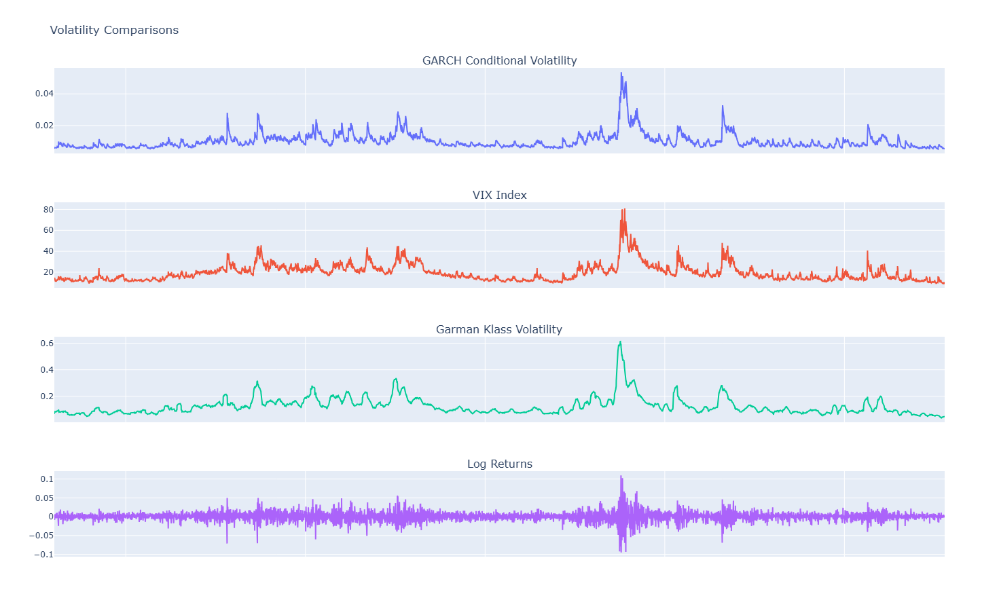

In [32]:
plot_vol_comparision(vol_garch, vix, train_ret, garman_klass_vol)

In [33]:
def model_hmm(df, n_states):
    
    df = np.expand_dims(df, 1)
    df = np.reshape(df,[len(df),1])
    
    model = GaussianHMM(n_components = n_states, n_iter = 100, random_state = 1234).fit(df)

    print("Model Score:", model.score(df))

    states = model.predict(df)
    post_prob = np.array(model.predict_proba(df))
 
    # fit HMM parameters
    mus = np.squeeze(model.means_)
    sigmas = np.squeeze(np.sqrt(model.covars_))
    transmat = np.array(model.transmat_)
    print(mus)
    print(sigmas)
    
    return (states, mus, sigmas, transmat, post_prob, model)

In [34]:
states, mus, sigmas, transmat, post_prob, mod_hmm = model_hmm(train_ret['log_ret'], 3)

Model Score: 20484.18558513132
[-0.00232426 -0.00011676  0.00081986]
[0.03052625 0.01252087 0.0062406 ]


In [35]:
def plot_model(dates, vol, post_prob):
    fig = go.Figure()

    fig.add_trace(go.Scatter(x=dates, y=vol, name="GARCH", mode='lines', line_shape='hv', yaxis = 'y1'))

    fig.add_trace(go.Scatter(x=dates, y=post_prob[:,0], name = 'Pr(High Vol Regime)', mode='lines', line_shape='hv',
                             line=dict(width=0.5, color='red'), 
                             stackgroup='two', yaxis = 'y2'))

    fig.add_trace(go.Scatter(x=dates, y=post_prob[:,1], name = 'Pr(Medium Vol Regime)', mode='lines', line_shape='hv',
                             line=dict(width=0.5, color='orange'),
                             stackgroup='two', yaxis = 'y2'))

    fig.add_trace(go.Scatter(x=dates, y=post_prob[:,2], name = 'Pr(Low Vol Regime)', mode='lines', line_shape='hv',
                             line=dict(width=0.5, color='green'),
                             stackgroup='two', yaxis = 'y2'))

    fig.update_layout(
        title = ("Volatility Regime - HMM"),
        height = 400,
        yaxis=dict(title="Volatility"),
        yaxis2=dict(title="Posterier Probability", overlaying="y1", side="right")
    )

    fig.show()

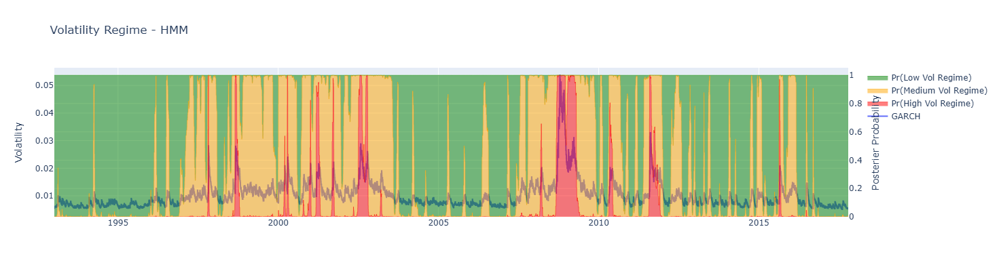

In [36]:
plot_model(vol_garch['Date'], vol_garch['vol'], post_prob)

In [37]:
train_ret_states = pl.concat([train_ret, pl.DataFrame(states)], how = 'horizontal')
train_ret_states = train_ret_states.rename({'column_0' : 'state'})
train_ret_states['state'].unique()

state
i64
0
1
2


In [38]:
train_ret_state_0 = train_ret_states.filter(pl.col('state') == 0)
train_ret_state_1 = train_ret_states.filter(pl.col('state') == 1)
train_ret_state_2 = train_ret_states.filter(pl.col('state') == 2)

In [39]:
mod_garch_state_0, res_garch_state_0, vol_garch_state_0 = model_garch(train_ret_state_0['log_ret'], train_ret_state_0['Date'])
res_garch_state_0.summary()

Iteration:      1,   Func. Count:      4,   Neg. LLF: -724.6722206721971
Optimization terminated successfully    (Exit mode 0)
            Current function value: -724.6722205056652
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1


<class 'statsmodels.iolib.summary.Summary'>
"""
                       Zero Mean - GARCH Model Results                        
==============================================================================
Dep. Variable:                      y   R-squared:                       0.000
Mean Model:                 Zero Mean   Adj. R-squared:                  0.003
Vol Model:                      GARCH   Log-Likelihood:                724.672
Distribution:                  Normal   AIC:                          -1443.34
Method:            Maximum Likelihood   BIC:                          -1431.86
                                        No. Observations:                  340
Date:                Wed, Nov 06 2024   Df Residuals:                      340
Time:                        15:03:40   Df Model:                            0
                              Volatility Model                              
============================================================================
                 coef    std err          t      P>|t|      95.0% Conf. Int.
----------------------------------------------------------------------------
omega      1.8216e-05  6.451e-06      2.824  4.746e-03 [5.572e-06,3.086e-05]
alpha[1]       0.1000  3.508e-02      2.851  4.365e-03   [3.124e-02,  0.169]
beta[1]        0.8800  2.287e-02     38.481      0.000     [  0.835,  0.925]
============================================================================

Covariance estimator: robust
"""

In [40]:
res_garch_state_0.arch_lm_test()

ARCH-LM Test
H0: Residuals are homoskedastic.
ARCH-LM Test
H1: Residuals are conditionally heteroskedastic.
Statistic: 74.9588
P-value: 0.0000
Distributed: chi2(17)
WaldTestStatistic, id: 0x21322c334d0

In [41]:
mod_garch_state_1, res_garch_state_1, vol_garch_state_1 = model_garch(train_ret_state_1['log_ret'], train_ret_state_1['Date'])
res_garch_state_1.summary()

Iteration:      1,   Func. Count:      5,   Neg. LLF: -4064.0281085594283
Iteration:      2,   Func. Count:     10,   Neg. LLF: -7247.5681910466665
Iteration:      3,   Func. Count:     15,   Neg. LLF: -7247.5681910466665
Iteration:      4,   Func. Count:     20,   Neg. LLF: -7247.5681910466665
Iteration:      5,   Func. Count:     25,   Neg. LLF: -7247.5681910466665
Iteration:      6,   Func. Count:     29,   Neg. LLF: -7264.334761366472
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7264.33476169536
            Iterations: 10
            Function evaluations: 29
            Gradient evaluations: 6


<class 'statsmodels.iolib.summary.Summary'>
"""
                       Zero Mean - GARCH Model Results                        
==============================================================================
Dep. Variable:                      y   R-squared:                       0.000
Mean Model:                 Zero Mean   Adj. R-squared:                  0.000
Vol Model:                      GARCH   Log-Likelihood:                7264.33
Distribution:                  Normal   AIC:                          -14522.7
Method:            Maximum Likelihood   BIC:                          -14505.3
                                        No. Observations:                 2438
Date:                Wed, Nov 06 2024   Df Residuals:                     2438
Time:                        15:03:40   Df Model:                            0
                              Volatility Model                              
============================================================================
                 coef    std err          t      P>|t|      95.0% Conf. Int.
----------------------------------------------------------------------------
omega      7.8360e-06  4.870e-14  1.609e+08      0.000 [7.836e-06,7.836e-06]
alpha[1]       0.0257  2.195e-04    116.856      0.000 [2.522e-02,2.608e-02]
beta[1]        0.9229  2.465e-03    374.403      0.000     [  0.918,  0.928]
============================================================================

Covariance estimator: robust
"""

In [42]:
res_garch_state_1.arch_lm_test()

ARCH-LM Test
H0: Residuals are homoskedastic.
ARCH-LM Test
H1: Residuals are conditionally heteroskedastic.
Statistic: 84.7243
P-value: 0.0000
Distributed: chi2(27)
WaldTestStatistic, id: 0x21322c306b0

In [43]:
mod_garch_state_2, res_garch_state_2, vol_garch_state_2 = model_garch(train_ret_state_2['log_ret'], train_ret_state_2['Date'])
res_garch_state_2.summary()

Iteration:      1,   Func. Count:      4,   Neg. LLF: -12775.051994270652
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12775.05200549642
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1


<class 'statsmodels.iolib.summary.Summary'>
"""
                       Zero Mean - GARCH Model Results                        
==============================================================================
Dep. Variable:                      y   R-squared:                       0.000
Mean Model:                 Zero Mean   Adj. R-squared:                  0.000
Vol Model:                      GARCH   Log-Likelihood:                12775.1
Distribution:                  Normal   AIC:                          -25544.1
Method:            Maximum Likelihood   BIC:                          -25525.7
                                        No. Observations:                 3465
Date:                Wed, Nov 06 2024   Df Residuals:                     3465
Time:                        15:03:40   Df Model:                            0
                              Volatility Model                              
============================================================================
                 coef    std err          t      P>|t|      95.0% Conf. Int.
----------------------------------------------------------------------------
omega      7.4578e-07  1.325e-11  5.627e+04      0.000 [7.458e-07,7.458e-07]
alpha[1]       0.0100  2.434e-03      4.109  3.976e-05 [5.230e-03,1.477e-02]
beta[1]        0.9700  2.549e-03    380.512      0.000     [  0.965,  0.975]
============================================================================

Covariance estimator: robust
"""

In [44]:
res_garch_state_2.arch_lm_test()

ARCH-LM Test
H0: Residuals are homoskedastic.
ARCH-LM Test
H1: Residuals are conditionally heteroskedastic.
Statistic: 70.4494
P-value: 0.0000
Distributed: chi2(30)
WaldTestStatistic, id: 0x21322bfdfd0

In [114]:
# def roll_forecast(test)


history = train_ret
state_0_history = train_ret_state_0
state_1_history = train_ret_state_1
state_2_history = train_ret_state_2

hmm_garch_vol = pl.DataFrame()

for row in test_ret.rows(named = True):

    row = pl.DataFrame(row).with_columns(pl.col('Date').dt.cast_time_unit('ns'))
    history = pl.concat([history, row])

    df = np.expand_dims(history['log_ret'], 1)
    df = np.reshape(df,[len(df),1])

    state_forecast = mod_hmm.predict(df)
    print(f'{state_forecast[-1]} : {row['Date'].item()}')

    row = pl.concat([row, pl.DataFrame([state_forecast[-1]])],  how = 'horizontal')
    row = row.rename({'column_0' : 'state'})

    if state_forecast[-1] == 0:
        state_0_history = pl.concat([state_0_history, row], how = 'vertical')
        mod_garch_0, res_garch_0, vol_garch_0 = model_garch(state_0_history['log_ret'], state_0_history['Date'])
        row = row.join(vol_garch_0, on = 'Date')
        hmm_garch_vol = pl.concat([hmm_garch_vol, row])        
        
    elif state_forecast[-1] == 1:
        state_1_history = pl.concat([state_1_history, row], how = 'vertical')
        mod_garch_1, res_garch_1, vol_garch_1 = model_garch(state_1_history['log_ret'], state_1_history['Date'])
        row = row.join(vol_garch_1, on = 'Date')
        hmm_garch_vol = pl.concat([hmm_garch_vol, row])
        
    elif state_forecast[-1] == 2:
        state_2_history = pl.concat([state_2_history, row], how = 'vertical')
        mod_garch_2, res_garch_2, vol_garch_2 = model_garch(state_2_history['log_ret'], state_2_history['Date'])
        row = row.join(vol_garch_2, on = 'Date')
        hmm_garch_vol = pl.concat([hmm_garch_vol, row])


hmm_garch_vol =\
(
    hmm_garch_vol.with_columns(
        pl.when(pl.col('state') == 0)
        .then(pl.lit('green'))
        .when(pl.col('state') == 1)
        .then(pl.lit('blue'))
        .when(pl.col('state') == 2)
        .then(pl.lit('red'))
        .alias('color')
    )
)

display(hmm_garch_vol)

2 : 2017-10-17 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -12779.340075836886
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12779.340087162585
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2017-10-18 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -12783.629100809629
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12783.629112235667
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2017-10-19 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -12787.92821123547
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12787.92822276468
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2017-10-20 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -12791

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -12832.574392224258
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12832.574404146486
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2017-11-06 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -12836.851772251845
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12836.851784266932
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2017-11-07 00:00:00
Iteration:      1,   Func. Count:      5,   Neg. LLF: 3692632.3756942498
Iteration:      2,   Func. Count:     12,   Neg. LLF: -7657.735371682227
Iteration:      3,   Func. Count:     18,   Neg. LLF: -12849.569096655574
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12849.569096778749
            Iterations: 7
            Function evaluations

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




2 : 2017-11-14 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -12862.31392481901
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -12862.31393733491
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2017-11-15 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -12866.090704124696
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12866.090716594448
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2017-11-16 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -12869.239204428728
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12869.239216684482
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2017-11-17 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -12873.

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -12901.045786935947
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12901.045799268843
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2017-11-30 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -12904.21547280658
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12904.215484957658
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2017-12-01 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -12908.436912315421
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12908.436924536853
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2017-12-04 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -12912.710543962898
Optimizat

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -12960.845470090871
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12960.845482639867
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2017-12-21 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -12965.073073582895
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -12965.073086203372
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2017-12-22 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -12969.365479507818
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12969.365492215264
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2017-12-26 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -12973.645205762596
Optimizat

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -13020.03051498073
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13020.03052761828
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2018-01-16 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -13024.108779326925
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13024.108792001894
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2018-01-17 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -13026.94448764182
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13026.944500086154
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2018-01-18 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -13031.175416273567
Optimizatio

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      5,   Neg. LLF: 3693456.972999814
Iteration:      2,   Func. Count:     12,   Neg. LLF: -12982.735980959236
Iteration:      3,   Func. Count:     16,   Neg. LLF: -13056.701934381897
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13056.70193312395
            Iterations: 7
            Function evaluations: 16
            Gradient evaluations: 3
2 : 2018-01-25 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -13051.098731212536
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -13051.098743818715
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2018-01-26 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -13053.119193401775
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13053.11920561521
            Iterations: 5
            Function evaluations: 

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




2 : 2018-02-02 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -13064.720030809505
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13064.720041697114
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
1 : 2018-02-05 00:00:00
Iteration:      1,   Func. Count:      5,   Neg. LLF: 2634.981560448071
Iteration:      2,   Func. Count:     13,   Neg. LLF: -7245.688224738686
Iteration:      3,   Func. Count:     18,   Neg. LLF: 100211385.95429257
Iteration:      4,   Func. Count:     24,   Neg. LLF: -7198.848939919165
Iteration:      5,   Func. Count:     29,   Neg. LLF: -7249.809671913102
Iteration:      6,   Func. Count:     34,   Neg. LLF: -7208.344819191547
Iteration:      7,   Func. Count:     39,   Neg. LLF: -7248.700762623379
Iteration:      8,   Func. Count:     44,   Neg. LLF: -7261.494968058301
Iteration:      9,   Func. Count:     49,   Neg. LLF: -7263.862154377176
Iteration:    

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -13289.20031077877
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13289.200321964265
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2018-08-02 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -13293.0674842677
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13293.067495475962
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2018-08-03 00:00:00
Iteration:      1,   Func. Count:      5,   Neg. LLF: 3694747.588074115
Iteration:      2,   Func. Count:     12,   Neg. LLF: -13232.651919887197
Iteration:      3,   Func. Count:     16,   Neg. LLF: -13306.09301621441
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13306.093014358346
            Iterations: 7
            Function evaluations: 16

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




2 : 2018-08-10 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -13317.006061165182
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13317.006072639815
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2018-08-13 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -13320.996123505165
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13320.99613502436
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2018-08-14 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -13324.625092349477
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -13324.625103836666
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2018-08-15 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -13327

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -13363.336789572848
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13363.336801244277
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2018-08-29 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -13367.088089719182
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13367.08810138177
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2018-08-30 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -13371.027948369048
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13371.027960063422
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2018-08-31 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -13375.263742517323
Inequalit

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -13391.801491641078
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13391.801503725332
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2018-09-10 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -13395.99779654183
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13395.997808714488
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2018-09-11 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -13400.035998167607
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13400.036010390839
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2018-09-12 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -13404.290887456365
Optimizat

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -13419.952329156138
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13419.952341556218
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2018-09-19 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -13424.1888962784
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13424.188908775246
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2018-09-20 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -13427.485703931894
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13427.485716292713
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2018-09-21 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -13431.742130582454
Optimizati

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -13448.400370164065
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -13448.40035398142
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2018-09-28 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -13452.842061779898
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13452.842045681882
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2018-10-01 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -13456.98955431717
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13456.989538241462
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2018-10-02 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -13461.447757158858
Optimizatio

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -13528.489634657504
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13528.489647189683
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2019-02-25 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -13532.717340721832
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13532.717353336018
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2019-02-26 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -13536.962450625644
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13536.96246332641
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2019-02-27 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -13541.216428830525
Optimizat

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The

Iteration:      1,   Func. Count:      4,   Neg. LLF: -13576.668339831514
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -13576.668351990726
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2019-03-14 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -13580.886916129668
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13580.886928362786
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2019-03-15 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -13584.751592654251
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -13584.751604899564
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2019-03-18 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -13588.781563056422
Optimizati

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -13598.393142002453
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13598.393153293971
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2019-03-25 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -13602.56553377915
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13602.56554512541
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2019-03-26 00:00:00
Iteration:      1,   Func. Count:      5,   Neg. LLF: 3834594.127481516
Iteration:      2,   Func. Count:     12,   Neg. LLF: -13541.962517181793
Iteration:      3,   Func. Count:     16,   Neg. LLF: -13615.702800445713
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13615.702797809116
            Iterations: 7
            Function evaluations: 

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -13624.087814483622
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13624.08782576276
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2019-04-03 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -13628.208180801324
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13628.20819213488
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2019-04-04 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -13632.336344571126
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -13632.33635596179
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2019-04-05 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -13636.234107454537
Optimization

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      5,   Neg. LLF: 3857026.6169202514
Iteration:      2,   Func. Count:     12,   Neg. LLF: -13609.083706151341
Iteration:      3,   Func. Count:     16,   Neg. LLF: -13682.159869146457
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13682.15986732793
            Iterations: 7
            Function evaluations: 16
            Gradient evaluations: 3
2 : 2019-04-22 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -13676.860758900817
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -13676.860770864409
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2019-04-23 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -13679.945250237832
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13679.945262067416
            Iterations: 5
            Function evaluations

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




2 : 2019-05-08 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -13719.280154119606
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13719.280165482545
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2019-05-09 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -13723.35121497868
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13723.351226396073
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2019-05-10 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -13727.360063277752
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13727.360074740724
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
1 : 2019-05-13 00:00:00
Iteration:      1,   Func. Count:      5,   Neg. LLF: -7645

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -13762.213444676021
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -13762.213456318495
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2019-06-25 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -13765.115215335283
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13765.115226824582
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2019-06-26 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -13769.302213867564
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13769.302225433308
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2019-06-27 00:00:00
Iteration:      1,   Func. Count:      5,   Neg. LLF: 3857147.799368839
Iteration: 

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      2,   Func. Count:     12,   Neg. LLF: -13744.893365315402
Iteration:      3,   Func. Count:     17,   Neg. LLF: -4570.686822146138
Iteration:      4,   Func. Count:     24,   Neg. LLF: -13817.455932557026
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13817.455931999382
            Iterations: 8
            Function evaluations: 24
            Gradient evaluations: 4
2 : 2019-07-12 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -13812.110662162266
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13812.110674011641
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2019-07-15 00:00:00
Iteration:      1,   Func. Count:      5,   Neg. LLF: 3857123.6590566356
Iteration:      2,   Func. Count:     11,   Neg. LLF: -13825.24828451228
Optimization terminated successfully    (Exit mode 0)
            Current function value: -138

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -13858.823418359567
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13858.823430463675
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2019-07-31 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -13861.256024277913
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13861.25603609441
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2019-08-01 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -13864.2821218192
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -13864.282133495555
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2019-08-02 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -13867.727213009335
Optimization

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      5,   Neg. LLF: 2886.085046698386
Iteration:      2,   Func. Count:     13,   Neg. LLF: 2220.5203845956707
Iteration:      3,   Func. Count:     18,   Neg. LLF: 1263678438.9518094
Iteration:      4,   Func. Count:     24,   Neg. LLF: -7697.8456777064475
Iteration:      5,   Func. Count:     29,   Neg. LLF: -7718.991006932798
Iteration:      6,   Func. Count:     34,   Neg. LLF: -6560.890288873367
Iteration:      7,   Func. Count:     39,   Neg. LLF: -7719.577112962745
Iteration:      8,   Func. Count:     44,   Neg. LLF: 246256754.6381767
Iteration:      9,   Func. Count:     49,   Neg. LLF: -7731.870461405904
Iteration:     10,   Func. Count:     54,   Neg. LLF: -7732.540779238153
Iteration:     11,   Func. Count:     60,   Neg. LLF: -7732.571764869679
Iteration:     12,   Func. Count:     74,   Neg. LLF: -7732.573773983771
Iteration:     13,   Func. Count:     88,   Neg. LLF: -7732.573430042392
Iteration:     14,   Func. Count:    102,   Neg. LLF

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




2 : 2019-09-20 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -13892.463751403566
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -13892.463763424423
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2019-09-23 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -13896.698984301387
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13896.698996413745
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2019-09-24 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -13899.859661949984
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13899.85967392764
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2019-09-25 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -13903

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -14004.02174015054
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -14004.021752035555
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2019-11-14 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14008.245722067983
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -14008.245734046974
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2019-11-15 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14011.598437181585
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -14011.59844906385
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2019-11-18 00:00:00
Iteration:      1,   Func. Count:      5,   Neg. LLF: 3891127.608213543
Iteration:     

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -14028.2952116395
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14028.295223854262
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2019-11-22 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14032.470930544341
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -14032.470942843549
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2019-11-25 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14035.857440048072
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14035.857452245862
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2019-11-26 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14040.03053420097
Inequality c

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -14054.670405418407
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14054.670417556674
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2019-12-04 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14058.309312353736
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14058.309324456874
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2019-12-05 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14062.515704535108
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14062.51571672493
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2019-12-06 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14065.499399502241
Optimizat

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -14081.051016580668
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -14081.051028659576
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2019-12-13 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14085.289287484364
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -14085.289299654745
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2019-12-16 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14088.761144723068
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14088.761156823057
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2019-12-17 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14092.998454582008
Optimizati

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




2 : 2019-12-23 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14109.294180184308
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14109.294192603142
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2019-12-24 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14113.546213102745
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14113.546225618538
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2019-12-26 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14117.394116780639
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14117.394129300916
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2019-12-27 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -141

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -14202.006130964433
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14202.006142784012
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2020-01-31 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14201.613579872406
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14201.613591024168
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2020-02-03 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14205.093110656144
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14205.093121794844
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
1 : 2020-02-04 00:00:00
Iteration:      1,   Func. Count:      5,   Neg. LLF: -7566.825351043848
Iteration

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -14228.283598709579
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14228.283610005383
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2020-02-14 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14232.426255818149
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14232.426267175906
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2020-02-18 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14236.502087423196
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14236.502098835372
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2020-02-19 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14240.3933456228
Optimizati

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -14279.76285902362
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14279.762870261893
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2020-08-18 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14283.88003959282
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14283.880050894913
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2020-08-19 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14287.805138149639
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14287.805149488013
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2020-08-20 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14291.86373624565
Optimizatio

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -14305.480952037658
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14305.480963238675
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2020-08-27 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14309.631416700973
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14309.631427971792
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2020-08-28 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14313.20402925897
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14313.204040513256
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2020-08-31 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14317.330008992121
Optimizat

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -14355.180690671146
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14355.180701621523
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2020-12-21 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14359.152902654914
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -14359.15291365255
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2020-12-22 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14363.275006589429
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14363.275017655782
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2020-12-23 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14367.4522571474
Optimization

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -14399.99823817937
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -14399.998248723175
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2021-01-11 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14403.600858345646
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14403.600868899843
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2021-01-12 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14407.75037082843
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -14407.750381449441
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2021-01-13 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14411.841628608769
Inequality c

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




2 : 2021-01-20 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14424.294506817645
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14424.29451726696
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2021-01-21 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14428.436826501227
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14428.436837016205
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2021-01-22 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14432.471509531284
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -14432.471520103169
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2021-01-25 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14436

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      5,   Neg. LLF: -7446.926494935726
Iteration:      2,   Func. Count:     10,   Neg. LLF: 159.03116563882594
Iteration:      3,   Func. Count:     15,   Neg. LLF: -8198.879503863209
Iteration:      4,   Func. Count:     20,   Neg. LLF: -8198.879503863209
Iteration:      5,   Func. Count:     25,   Neg. LLF: -8198.879503863209
Iteration:      6,   Func. Count:     30,   Neg. LLF: -8198.879503863209
Iteration:      7,   Func. Count:     36,   Neg. LLF: -6154.978149322271
Iteration:      8,   Func. Count:     45,   Neg. LLF: -8198.879503863209
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8214.006366839141
            Iterations: 9
            Function evaluations: 55
            Gradient evaluations: 8
1 : 2021-01-28 00:00:00
Iteration:      1,   Func. Count:      5,   Neg. LLF: -7433.382166577153
Iteration:      2,   Func. Count:     10,   Neg. LLF: -6157.255617324077
Iteration:      3,   Func. Count:     

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -14468.380300186725
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14468.380311237144
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2021-02-24 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14470.830408597896
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14470.830419438646
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
1 : 2021-02-25 00:00:00
Iteration:      1,   Func. Count:      5,   Neg. LLF: 3176.6092546415503
Iteration:      2,   Func. Count:     13,   Neg. LLF: -8234.88684158793
Iteration:      3,   Func. Count:     18,   Neg. LLF: 108456088.15256163
Iteration:      4,   Func. Count:     24,   Neg. LLF: -8234.886847842416
Iteration:      5,   Func. Count:     29,   Neg. LLF: -8236.632606484649
Iteration:      6,   Fun

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      3,   Func. Count:     15,   Neg. LLF: -6192.380819449034
Iteration:      4,   Func. Count:     24,   Neg. LLF: -8249.044397965969
Iteration:      5,   Func. Count:     28,   Neg. LLF: -8263.8270603286
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8263.827060383863
            Iterations: 9
            Function evaluations: 28
            Gradient evaluations: 5
1 : 2021-03-05 00:00:00
Iteration:      1,   Func. Count:      5,   Neg. LLF: -7279.414465047356
Iteration:      2,   Func. Count:     10,   Neg. LLF: -6193.942238652282
Iteration:      3,   Func. Count:     18,   Neg. LLF: -8251.349150003787
Iteration:      4,   Func. Count:     23,   Neg. LLF: -8251.349150003787
Iteration:      5,   Func. Count:     27,   Neg. LLF: -8266.032118203957
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8266.032119659958
            Iterations: 9
            Function evaluations: 27
            Gr

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




2 : 2021-04-30 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14532.385463216724
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14532.385473995662
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2021-05-03 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14536.459486991484
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14536.459497838794
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2021-05-04 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14540.036924713448
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -14540.036935551037
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2021-05-05 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -1454

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      4,   Func. Count:     23,   Neg. LLF: -8330.323110867515
Iteration:      5,   Func. Count:     28,   Neg. LLF: -8330.323110867515
Iteration:      6,   Func. Count:     33,   Neg. LLF: 1493452496.470812
Iteration:      7,   Func. Count:     40,   Neg. LLF: -6367.283578766614
Iteration:      8,   Func. Count:     48,   Neg. LLF: -8345.787477212387
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8345.787476813854
            Iterations: 12
            Function evaluations: 48
            Gradient evaluations: 8
1 : 2021-05-17 00:00:00
Iteration:      1,   Func. Count:      5,   Neg. LLF: 3225.2284182486387
Iteration:      2,   Func. Count:     13,   Neg. LLF: -8333.74054146067
Iteration:      3,   Func. Count:     18,   Neg. LLF: 196085819.95215935
Iteration:      4,   Func. Count:     24,   Neg. LLF: -8333.74055570962
Iteration:      5,   Func. Count:     29,   Neg. LLF: -8335.89506186897
Iteration:      6,   Func. Count:     34,

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -14577.603404784913
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14577.603415815222
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2021-06-03 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14581.612724503133
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14581.612735593146
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2021-06-04 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14584.739199159116
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14584.739210145959
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2021-06-07 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14588.918777952373
Optimiza

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -14640.571125642244
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14640.571136609324
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2021-06-28 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14644.689361885183
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14644.689372928096
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2021-06-29 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14648.88446080462
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14648.88447193802
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2021-06-30 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14653.06105819388
Optimizatio

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




2 : 2021-07-22 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14702.927676466603
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14702.927686752464
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2021-07-23 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14705.784420275842
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14705.784430490126
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2021-07-26 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14709.858932465755
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14709.858942739045
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2021-07-27 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -147

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -14769.438394136763
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14769.438405208279
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2021-08-17 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14772.935852407794
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14772.935863437426
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2021-08-18 00:00:00
Iteration:      1,   Func. Count:      5,   Neg. LLF: 3911604.1430738294
Iteration:      2,   Func. Count:     12,   Neg. LLF: -11786.824211887299
Iteration:      3,   Func. Count:     21,   Neg. LLF: -14710.44492651037
Iteration:      4,   Func. Count:     25,   Neg. LLF: -14783.986490177254
Optimization terminated successfully    (Exit mode 0)
            Current function value: -147

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -14790.315176647622
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14790.315187470513
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2021-08-25 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14794.438529046702
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14794.438539947083
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2021-08-26 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14798.161527383216
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14798.161538289434
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2021-08-27 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14801.292391516195
Optimiza

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




2 : 2021-09-02 00:00:00
Iteration:      1,   Func. Count:      5,   Neg. LLF: 3911625.608973263
Iteration:      2,   Func. Count:     11,   Neg. LLF: -14825.775774946127
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14825.775771346709
            Iterations: 6
            Function evaluations: 11
            Gradient evaluations: 2
2 : 2021-09-03 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14821.887685701677
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14821.887696896607
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2021-09-07 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14825.933763758014
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14825.933775017405
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2021-

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




2 : 2021-09-20 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14855.657902420544
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -14855.657912888313
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2021-09-21 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14859.823847908967
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14859.823858451891
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2021-09-22 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14862.798553808998
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14862.798564253428
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2021-09-23 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -1486

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




1 : 2021-09-28 00:00:00
Iteration:      1,   Func. Count:      5,   Neg. LLF: -7687.187415397693
Iteration:      2,   Func. Count:     10,   Neg. LLF: -8355.619120075455
Iteration:      3,   Func. Count:     15,   Neg. LLF: -8355.619120075455
Iteration:      4,   Func. Count:     20,   Neg. LLF: -8355.619120075455
Iteration:      5,   Func. Count:     25,   Neg. LLF: -6274.256253331367
Iteration:      6,   Func. Count:     33,   Neg. LLF: -8371.336353604882
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8371.336353275066
            Iterations: 10
            Function evaluations: 33
            Gradient evaluations: 6
1 : 2021-09-29 00:00:00
Iteration:      1,   Func. Count:      5,   Neg. LLF: 3236.771581817491
Iteration:      2,   Func. Count:     13,   Neg. LLF: -5547.185269452833
Iteration:      3,   Func. Count:     18,   Neg. LLF: 1443751436.7645526
Iteration:      4,   Func. Count:     24,   Neg. LLF: 17744.391246801642
Iteration:    

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




2 : 2021-11-16 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14955.475560169263
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14955.475571338573
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2021-11-17 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14959.594673114076
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14959.594684360445
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2021-11-18 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -14963.64932501533
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14963.64933632539
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2021-11-19 00:00:00
Iteration:      1,   Func. Count:      5,   Neg. LLF: 397601

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      5,   Neg. LLF: -7830.242080080638
Iteration:      2,   Func. Count:     10,   Neg. LLF: -6400.902038435159
Iteration:      3,   Func. Count:     18,   Neg. LLF: -8521.938439281466
Iteration:      4,   Func. Count:     23,   Neg. LLF: -8521.938439281466
Iteration:      5,   Func. Count:     28,   Neg. LLF: -8521.938439281466
Iteration:      6,   Func. Count:     32,   Neg. LLF: -8538.405249359748
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8538.405251370892
            Iterations: 10
            Function evaluations: 32
            Gradient evaluations: 6
1 : 2022-01-25 00:00:00
Iteration:      1,   Func. Count:      5,   Neg. LLF: 3320.289394561414
Iteration:      2,   Func. Count:     13,   Neg. LLF: -8253.864795664269
Iteration:      3,   Func. Count:     18,   Neg. LLF: 1472107593.631938
Iteration:      4,   Func. Count:     24,   Neg. LLF: 20187.325163834637
Iteration:      5,   Func. Count:     2

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:     29,   Func. Count:    322,   Neg. LLF: -8646.272586889783
Iteration:     30,   Func. Count:    336,   Neg. LLF: -8646.272427192565
Iteration:     31,   Func. Count:    350,   Neg. LLF: -8646.270427673833
Iteration:     32,   Func. Count:    364,   Neg. LLF: -8646.271472924283
Iteration:     33,   Func. Count:    378,   Neg. LLF: -8646.27259563209
Iteration:     34,   Func. Count:    392,   Neg. LLF: -8646.26981137695
Iteration:     35,   Func. Count:    406,   Neg. LLF: -8646.272351240477
Iteration:     36,   Func. Count:    420,   Neg. LLF: -8646.275400043325
Iteration:     37,   Func. Count:    434,   Neg. LLF: -8646.268169903287
Iteration:     38,   Func. Count:    448,   Neg. LLF: -8646.27141937563
Iteration:     39,   Func. Count:    462,   Neg. LLF: -8646.273982348532
Iteration:     40,   Func. Count:    476,   Neg. LLF: -8646.271375439295
Iteration:     41,   Func. Count:    490,   Neg. LLF: -8646.271663502435
Iteration:     42,   Func. Count:    504,   Neg. LLF: 

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:     11,   Func. Count:     62,   Neg. LLF: -8786.731624900698
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8786.815946069477
            Iterations: 11
            Function evaluations: 72
            Gradient evaluations: 11
1 : 2022-07-13 00:00:00
Iteration:      1,   Func. Count:      5,   Neg. LLF: -8757.820737651522
Iteration:      2,   Func. Count:     10,   Neg. LLF: -6584.735678184778
Iteration:      3,   Func. Count:     19,   Neg. LLF: -8773.5975765947
Iteration:      4,   Func. Count:     23,   Neg. LLF: -8789.638062873404
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8789.638063039734
            Iterations: 8
            Function evaluations: 23
            Gradient evaluations: 4
1 : 2022-07-14 00:00:00
Iteration:      1,   Func. Count:      5,   Neg. LLF: -7942.357349429206
Iteration:      2,   Func. Count:     10,   Neg. LLF: -8777.0071062602
Iteration:      3,   Func. 

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.




1 : 2022-11-03 00:00:00
Iteration:      1,   Func. Count:      5,   Neg. LLF: 3639.0384471452503
Iteration:      2,   Func. Count:     13,   Neg. LLF: -8993.398349890555
Iteration:      3,   Func. Count:     18,   Neg. LLF: 1171284178.5087676
Iteration:      4,   Func. Count:     24,   Neg. LLF: -8993.398363218363
Iteration:      5,   Func. Count:     29,   Neg. LLF: -8995.952159920651
Iteration:      6,   Func. Count:     34,   Neg. LLF: -8624.82229977854
Iteration:      7,   Func. Count:     40,   Neg. LLF: -8997.753149040296
Iteration:      8,   Func. Count:     45,   Neg. LLF: -9009.091617720274
Iteration:      9,   Func. Count:     50,   Neg. LLF: -9010.033149997795
Iteration:     10,   Func. Count:     55,   Neg. LLF: -9010.163299850568
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9010.230221204176
            Iterations: 10
            Function evaluations: 65
            Gradient evaluations: 10
1 : 2022-11-04 00:00:00
Iteration:   

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:     19,   Func. Count:    171,   Neg. LLF: -9075.962283588036
Iteration:     20,   Func. Count:    185,   Neg. LLF: -9075.974482406093
Iteration:     21,   Func. Count:    199,   Neg. LLF: -9075.976783506623
Iteration:     22,   Func. Count:    213,   Neg. LLF: -9075.960969976371
Iteration:     23,   Func. Count:    227,   Neg. LLF: -9075.973644818781
Iteration:     24,   Func. Count:    241,   Neg. LLF: -9075.966679852647
Iteration:     25,   Func. Count:    255,   Neg. LLF: -9075.961297435046
Iteration:     26,   Func. Count:    269,   Neg. LLF: -9075.969600632166
Iteration:     27,   Func. Count:    283,   Neg. LLF: -9075.966167619605
Iteration:     28,   Func. Count:    297,   Neg. LLF: -9075.971763572717
Iteration:     29,   Func. Count:    311,   Neg. LLF: -9075.970998737877
Iteration:     30,   Func. Count:    325,   Neg. LLF: -9075.965203707687
Iteration:     31,   Func. Count:    339,   Neg. LLF: -9075.97200383117
Iteration:     32,   Func. Count:    353,   Neg. LLF

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      5,   Neg. LLF: -7803.353249065807
Iteration:      2,   Func. Count:     10,   Neg. LLF: -9062.852914121482
Iteration:      3,   Func. Count:     15,   Neg. LLF: -9062.852914121482
Iteration:      4,   Func. Count:     20,   Neg. LLF: -9062.852914121482
Iteration:      5,   Func. Count:     25,   Neg. LLF: -9062.852914121482
Iteration:      6,   Func. Count:     30,   Neg. LLF: -6796.7546436330485
Iteration:      7,   Func. Count:     38,   Neg. LLF: -9079.085184046418
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9079.085183633062
            Iterations: 11
            Function evaluations: 38
            Gradient evaluations: 7
1 : 2022-12-14 00:00:00
Iteration:      1,   Func. Count:      5,   Neg. LLF: -8117.355970489874
Iteration:      2,   Func. Count:     10,   Neg. LLF: -9066.177899265182
Iteration:      3,   Func. Count:     15,   Neg. LLF: -6799.35774215089
Iteration:      4,   Func. Count:    

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      5,   Func. Count:     25,   Neg. LLF: -9070.73653964018
Iteration:      6,   Func. Count:     30,   Neg. LLF: -6802.3683692213435
Iteration:      7,   Func. Count:     38,   Neg. LLF: -9086.867159589177
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9086.867159078394
            Iterations: 11
            Function evaluations: 38
            Gradient evaluations: 7
1 : 2022-12-19 00:00:00
Iteration:      1,   Func. Count:      5,   Neg. LLF: 3684.3599818867315
Iteration:      2,   Func. Count:     13,   Neg. LLF: -8443.925126844886
Iteration:      3,   Func. Count:     18,   Neg. LLF: 1575547176.9224572
Iteration:      4,   Func. Count:     24,   Neg. LLF: -1326.2814981640431
Iteration:      5,   Func. Count:     29,   Neg. LLF: -9075.630187602801
Iteration:      6,   Func. Count:     34,   Neg. LLF: -9071.046077916726
Iteration:      7,   Func. Count:     39,   Neg. LLF: -9077.590436816754
Iteration:      8,   Func. Count:   

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:     15,   Func. Count:    127,   Neg. LLF: -9093.671473134875
Iteration:     16,   Func. Count:    141,   Neg. LLF: -9093.671096705895
Iteration:     17,   Func. Count:    155,   Neg. LLF: -9093.676736523787
Iteration:     18,   Func. Count:    169,   Neg. LLF: -9093.675035224878
Iteration:     19,   Func. Count:    183,   Neg. LLF: -9093.671166254251
Iteration:     20,   Func. Count:    197,   Neg. LLF: -9093.67874208823
Iteration:     21,   Func. Count:    211,   Neg. LLF: -9093.672994549237
Iteration:     22,   Func. Count:    225,   Neg. LLF: -9093.674451665975
Iteration:     23,   Func. Count:    239,   Neg. LLF: -9093.673848496575
Iteration:     24,   Func. Count:    253,   Neg. LLF: -9093.674331109441
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9093.737506019701
            Iterations: 24
            Function evaluations: 263
            Gradient evaluations: 24
1 : 2022-12-21 00:00:00
Iteration:      1,   Func. Count:   

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.




1 : 2023-02-09 00:00:00
Iteration:      1,   Func. Count:      5,   Neg. LLF: 3739.4328949041455
Iteration:      2,   Func. Count:     13,   Neg. LLF: -8922.668528461356
Iteration:      3,   Func. Count:     18,   Neg. LLF: 1590508956.0247211
Iteration:      4,   Func. Count:     24,   Neg. LLF: -119.05478401323262
Iteration:      5,   Func. Count:     29,   Neg. LLF: -9183.22080787471
Iteration:      6,   Func. Count:     34,   Neg. LLF: -9181.508019038876
Iteration:      7,   Func. Count:     39,   Neg. LLF: -9185.129055131856
Iteration:      8,   Func. Count:     44,   Neg. LLF: 41223987.035302766
Iteration:      9,   Func. Count:     49,   Neg. LLF: -9185.064058432967
Iteration:     10,   Func. Count:     54,   Neg. LLF: -9198.398139215984
Iteration:     11,   Func. Count:     59,   Neg. LLF: -9198.49794010307
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9198.665656841065
            Iterations: 11
            Function evaluations: 69
 

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.




1 : 2023-02-13 00:00:00
Iteration:      1,   Func. Count:      5,   Neg. LLF: -8132.563597841068
Iteration:      2,   Func. Count:     10,   Neg. LLF: -6892.1793492565885
Iteration:      3,   Func. Count:     17,   Neg. LLF: -9202.710062090282
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9202.710061752763
            Iterations: 7
            Function evaluations: 17
            Gradient evaluations: 3
1 : 2023-02-14 00:00:00
Iteration:      1,   Func. Count:      5,   Neg. LLF: -8250.496546609664
Iteration:      2,   Func. Count:     10,   Neg. LLF: 3743.4836561797824
Iteration:      3,   Func. Count:     18,   Neg. LLF: -9191.866227933398
Iteration:      4,   Func. Count:     23,   Neg. LLF: -8905.146112196668
Iteration:      5,   Func. Count:     29,   Neg. LLF: -9191.866227933398
Iteration:      6,   Func. Count:     34,   Neg. LLF: -9193.916621345852
Iteration:      7,   Func. Count:     39,   Neg. LLF: -8877.087058183424
Iteration:   

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.




Optimization terminated successfully    (Exit mode 0)
            Current function value: -9241.083449013491
            Iterations: 13
            Function evaluations: 76
            Gradient evaluations: 12
1 : 2023-03-02 00:00:00
Iteration:      1,   Func. Count:      5,   Neg. LLF: -8260.789593963611
Iteration:      2,   Func. Count:     10,   Neg. LLF: -6922.100176783959
Iteration:      3,   Func. Count:     18,   Neg. LLF: -9227.06342388148
Iteration:      4,   Func. Count:     23,   Neg. LLF: 1653180908.0007367
Iteration:      5,   Func. Count:     30,   Neg. LLF: -9243.436511948688
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9243.436511875898
            Iterations: 9
            Function evaluations: 30
            Gradient evaluations: 5
1 : 2023-03-03 00:00:00
Iteration:      1,   Func. Count:      5,   Neg. LLF: 3761.552631323585
Iteration:      2,   Func. Count:     13,   Neg. LLF: -9226.121644619381
Iteration:      3,   Func

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      5,   Func. Count:     29,   Neg. LLF: -9246.08762267126
Iteration:      6,   Func. Count:     34,   Neg. LLF: -9242.59252218164
Iteration:      7,   Func. Count:     39,   Neg. LLF: -9247.89279753796
Iteration:      8,   Func. Count:     44,   Neg. LLF: 23542395.77927982
Iteration:      9,   Func. Count:     49,   Neg. LLF: -9247.931934406399
Iteration:     10,   Func. Count:     54,   Neg. LLF: -9261.411780057502
Iteration:     11,   Func. Count:     59,   Neg. LLF: -9261.499332110223
Iteration:     12,   Func. Count:     73,   Neg. LLF: -9261.621762033019
Iteration:     13,   Func. Count:     87,   Neg. LLF: -9261.59793732272
Iteration:     14,   Func. Count:    101,   Neg. LLF: -9261.625757114558
Iteration:     15,   Func. Count:    115,   Neg. LLF: -9261.630664504535
Iteration:     16,   Func. Count:    129,   Neg. LLF: -9261.617472719303
Iteration:     17,   Func. Count:    143,   Neg. LLF: -9261.614530249335
Iteration:     18,   Func. Count:    157,   Neg. LLF: -9

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:     28,   Func. Count:    297,   Neg. LLF: -9311.552590770945
Iteration:     29,   Func. Count:    311,   Neg. LLF: -9311.547311698596
Iteration:     30,   Func. Count:    325,   Neg. LLF: -9311.554901103513
Iteration:     31,   Func. Count:    339,   Neg. LLF: -9311.551151508877
Iteration:     32,   Func. Count:    353,   Neg. LLF: -9311.553499268424
Iteration:     33,   Func. Count:    367,   Neg. LLF: -9311.556984770514
Iteration:     34,   Func. Count:    381,   Neg. LLF: -9311.546050153216
Iteration:     35,   Func. Count:    395,   Neg. LLF: -9311.550764193056
Iteration:     36,   Func. Count:    409,   Neg. LLF: -9311.550956885498
Iteration:     37,   Func. Count:    423,   Neg. LLF: -9311.552880010839
Iteration:     38,   Func. Count:    437,   Neg. LLF: -9311.552207783148
Iteration:     39,   Func. Count:    451,   Neg. LLF: -9311.55137070955
Iteration:     40,   Func. Count:    465,   Neg. LLF: -9311.555174279863
Iteration:     41,   Func. Count:    479,   Neg. LLF

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.




1 : 2023-04-04 00:00:00
Iteration:      1,   Func. Count:      5,   Neg. LLF: -8284.171849991184
Iteration:      2,   Func. Count:     10,   Neg. LLF: -9297.447083435789
Iteration:      3,   Func. Count:     15,   Neg. LLF: -6975.535281400411
Iteration:      4,   Func. Count:     24,   Neg. LLF: -9297.447083435789
Iteration:      5,   Func. Count:     29,   Neg. LLF: -9295.013611361243
Iteration:      6,   Func. Count:     33,   Neg. LLF: -9314.709746996741
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9314.709747377357
            Iterations: 10
            Function evaluations: 33
            Gradient evaluations: 6
1 : 2023-04-05 00:00:00
Iteration:      1,   Func. Count:      5,   Neg. LLF: 3797.736675918788
Iteration:      2,   Func. Count:     13,   Neg. LLF: -9300.865089221508
Iteration:      3,   Func. Count:     18,   Neg. LLF: 265411672.29782045
Iteration:      4,   Func. Count:     24,   Neg. LLF: -9300.865128856021
Iteration:    

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -15006.752244650579
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15006.752256250185
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2023-04-19 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -15010.98876302451
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15010.98877472505
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2023-04-20 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -15014.689822041406
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -15014.689833720176
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2023-04-21 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -15018.917150166675
Optimizatio

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -15027.5022773039
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15027.502288405653
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2023-04-27 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -15026.309892672014
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15026.309902851543
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2023-04-28 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -15029.591919255663
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15029.591929401167
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2023-05-01 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -15033.754986620268
Optimizati

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -15241.094979381242
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15241.094989970956
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2023-08-01 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -15245.178501359796
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15245.178512027
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2023-08-02 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -15246.73801581734
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15246.738026096456
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2023-08-03 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -15250.816172604045
Optimization

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -15261.653965267988
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15261.653975619203
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2023-08-09 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -15265.167971264815
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15265.167981600971
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2023-08-10 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -15269.333608271276
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15269.33361869469
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2023-08-11 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -15273.490546554689
Optimizat

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




2 : 2023-09-01 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -15323.478990767475
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15323.47900071121
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2023-09-05 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -15327.400369593626
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15327.40037958823
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2023-09-06 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -15330.932273818831
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15330.932283815844
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2023-09-07 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -15334

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




2 : 2023-09-11 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -15342.652167243326
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15342.652177383727
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2023-09-12 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -15346.390219574467
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15346.390229739767
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2023-09-13 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -15350.527015362346
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15350.527025609987
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2023-09-14 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -153

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




2 : 2023-12-15 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -15539.131834315114
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15539.131844789179
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2023-12-18 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -15543.0184186225
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15543.01842915226
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2023-12-19 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -15546.73451215489
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15546.734522712566
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
2 : 2023-12-20 00:00:00
Iteration:      1,   Func. Count:      4,   Neg. LLF: -15548.1

Date,log_ret,state,vol,color
datetime[ns],f64,i64,f64,str
2017-10-17 00:00:00,0.000672,2,0.005473,"""red"""
2017-10-18 00:00:00,0.000742,2,0.005458,"""red"""
2017-10-19 00:00:00,0.000328,2,0.005445,"""red"""
2017-10-20 00:00:00,0.005104,2,0.005431,"""red"""
2017-10-23 00:00:00,-0.00398,2,0.005442,"""red"""
…,…,…,…,…
2023-12-22 00:00:00,0.001659,2,0.006535,"""red"""
2023-12-26 00:00:00,0.004223,2,0.006495,"""red"""
2023-12-27 00:00:00,0.001429,2,0.006468,"""red"""


In [90]:
garch_history = train_ret
garch_garch_vol = pl.DataFrame()

for row in test_ret.rows(named = True):
    row = pl.DataFrame(row).with_columns(pl.col('Date').dt.cast_time_unit('ns'))
    garch_history = pl.concat([garch_history, pl.DataFrame(row)])
    mod_garch_garch, res_garch_garch, vol_garch_garch = model_garch(garch_history['log_ret'], garch_history['Date'])
    row = row.join(vol_garch_garch[-1], on = 'Date')
    garch_garch_vol = pl.concat([garch_garch_vol, row])

display(garch_garch_vol)

Iteration:      1,   Func. Count:      4,   Neg. LLF: -20437.027194004633
Optimization terminated successfully    (Exit mode 0)
            Current function value: -20437.027215082857
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -20441.383340632052
Optimization terminated successfully    (Exit mode 0)
            Current function value: -20441.383361761673
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -20445.757863734292
Optimization terminated successfully    (Exit mode 0)
            Current function value: -20445.75788491674
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -20449.62844315775
Optimization terminated successfully    (Exit mode 0)
            Current function

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -20893.855070814978
Optimization terminated successfully    (Exit mode 0)
            Current function value: -20893.855092465565
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -20897.327889213222
Optimization terminated successfully    (Exit mode 0)
            Current function value: -20897.327910887754
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -20901.102299074075
Optimization terminated successfully    (Exit mode 0)
            Current function value: -20901.102320817656
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -20903.843585090293
Optimization terminated successfully    (Exit mode 0)
            Current functi

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -21509.235868048898
Optimization terminated successfully    (Exit mode 0)
            Current function value: -21509.235889771997
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -21512.820753033415
Optimization terminated successfully    (Exit mode 0)
            Current function value: -21512.820774839107
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -21515.374050041242
Optimization terminated successfully    (Exit mode 0)
            Current function value: -21515.37407174034
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -21518.662190784282
Optimization terminated successfully    (Exit mode 0)
            Current functio

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -22359.644178852053
Optimization terminated successfully    (Exit mode 0)
            Current function value: -22359.644202472693
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -22363.194358727185
Optimization terminated successfully    (Exit mode 0)
            Current function value: -22363.19438232472
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -22367.289181245673
Optimization terminated successfully    (Exit mode 0)
            Current function value: -22367.289204879748
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -22371.396522240844
Optimization terminated successfully    (Exit mode 0)
            Current functio

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -22477.58285015015
Optimization terminated successfully    (Exit mode 0)
            Current function value: -22477.582882446295
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -22477.905376671886
Optimization terminated successfully    (Exit mode 0)
            Current function value: -22477.905409433748
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -22480.11256762465
Optimization terminated successfully    (Exit mode 0)
            Current function value: -22480.11260044042
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -22481.911979321987
Inequality constraints incompatible    (Exit mode 4)
            Current function v

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -22506.852715165776
Optimization terminated successfully    (Exit mode 0)
            Current function value: -22506.852749221667
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -22509.41833117693
Optimization terminated successfully    (Exit mode 0)
            Current function value: -22509.41836532544
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -22512.190106446884
Optimization terminated successfully    (Exit mode 0)
            Current function value: -22512.19014069937
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      5,   Neg. LLF: 3854328899.772505
Iteration:      2,   Func. Count:     10,   Neg. LLF: -22523.901947819926
Optimizatio

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -22566.12207415817
Optimization terminated successfully    (Exit mode 0)
            Current function value: -22566.12210929072
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -22569.41384339428
Optimization terminated successfully    (Exit mode 0)
            Current function value: -22569.41387860852
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -22572.711266975704
Optimization terminated successfully    (Exit mode 0)
            Current function value: -22572.711302270378
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -22576.07854429076
Optimization terminated successfully    (Exit mode 0)
            Current function va

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -22604.785364106567
Optimization terminated successfully    (Exit mode 0)
            Current function value: -22604.785398049145
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -22607.878242216473
Optimization terminated successfully    (Exit mode 0)
            Current function value: -22607.878276204217
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -22611.06169465223
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -22611.061728693014
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -22612.79136077129
Inequality constraints incompatible    (Exit mode 4)
            Current function v

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      2,   Func. Count:     11,   Neg. LLF: -13658.036118613025
Iteration:      3,   Func. Count:     18,   Neg. LLF: 3868918418.0657926
Iteration:      4,   Func. Count:     24,   Neg. LLF: -22657.547880871985
Optimization terminated successfully    (Exit mode 0)
            Current function value: -22657.547880670798
            Iterations: 8
            Function evaluations: 24
            Gradient evaluations: 4
Iteration:      1,   Func. Count:      4,   Neg. LLF: -22648.095865304145
Optimization terminated successfully    (Exit mode 0)
            Current function value: -22648.095899622014
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -22650.987763240904
Optimization terminated successfully    (Exit mode 0)
            Current function value: -22650.987797554255
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iterat

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -22691.41844374395
Optimization terminated successfully    (Exit mode 0)
            Current function value: -22691.41847847269
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -22694.840104143543
Optimization terminated successfully    (Exit mode 0)
            Current function value: -22694.840138894797
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -22698.30764452086
Optimization terminated successfully    (Exit mode 0)
            Current function value: -22698.307679298945
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -22702.007457727304
Optimization terminated successfully    (Exit mode 0)
            Current function 

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The

Iteration:      1,   Func. Count:      5,   Neg. LLF: 3874418122.3119383
Iteration:      2,   Func. Count:     11,   Neg. LLF: 1503.2307511979425
Iteration:      3,   Func. Count:     17,   Neg. LLF: -22768.767855953967
Optimization terminated successfully    (Exit mode 0)
            Current function value: -22768.767865031128
            Iterations: 7
            Function evaluations: 17
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      4,   Neg. LLF: -22759.614038522417
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -22759.61407363836
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -22763.54173969454
Optimization terminated successfully    (Exit mode 0)
            Current function value: -22763.541774858764
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The

Iteration:      1,   Func. Count:      4,   Neg. LLF: -22790.250603793742
Optimization terminated successfully    (Exit mode 0)
            Current function value: -22790.25063818349
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -22793.55002529695
Optimization terminated successfully    (Exit mode 0)
            Current function value: -22793.550059715802
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -22796.750036175257
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -22796.750070619746
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -22799.80068362663
Optimization terminated successfully    (Exit mode 0)
            Current function v

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -22834.48241044781
Optimization terminated successfully    (Exit mode 0)
            Current function value: -22834.482444877227
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -22836.990245755107
Optimization terminated successfully    (Exit mode 0)
            Current function value: -22836.99028015352
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -22840.22337252724
Optimization terminated successfully    (Exit mode 0)
            Current function value: -22840.223406952846
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -22843.43710346276
Optimization terminated successfully    (Exit mode 0)
            Current function v

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -22878.278628234337
Optimization terminated successfully    (Exit mode 0)
            Current function value: -22878.278662720855
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -22881.85275449328
Optimization terminated successfully    (Exit mode 0)
            Current function value: -22881.852789025223
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -22879.43771735945
Optimization terminated successfully    (Exit mode 0)
            Current function value: -22879.437751247602
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -22882.402204247323
Optimization terminated successfully    (Exit mode 0)
            Current function

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -22914.22545485353
Optimization terminated successfully    (Exit mode 0)
            Current function value: -22914.2254889089
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -22917.254118295787
Optimization terminated successfully    (Exit mode 0)
            Current function value: -22917.254152364265
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -22920.63929179764
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -22920.639325910703
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -22923.67265349292
Optimization terminated successfully    (Exit mode 0)
            Current function val

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -22989.8642108341
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -22989.864245506873
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -22993.523013262577
Optimization terminated successfully    (Exit mode 0)
            Current function value: -22993.523047963325
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -22997.35223584954
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -22997.352270601114
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      5,   Neg. LLF: 3919978708.651904
Iteration:      2,   Func. Count:     10,   Neg. LLF: -23010.705526747966
Optimization 

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -23036.9123497032
Optimization terminated successfully    (Exit mode 0)
            Current function value: -23036.912384479183
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -23039.127963473315
Optimization terminated successfully    (Exit mode 0)
            Current function value: -23039.127998118747
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -23042.747053336192
Optimization terminated successfully    (Exit mode 0)
            Current function value: -23042.74708799731
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -23046.294530333547
Optimization terminated successfully    (Exit mode 0)
            Current function 

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -23101.223872849514
Optimization terminated successfully    (Exit mode 0)
            Current function value: -23101.223906933534
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -23104.58604607909
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -23104.586080182853
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -23108.191494612875
Optimization terminated successfully    (Exit mode 0)
            Current function value: -23108.191528755862
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -23111.852170251455
Optimization terminated successfully    (Exit mode 0)
            Current function

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -23147.407082945465
Optimization terminated successfully    (Exit mode 0)
            Current function value: -23147.407116870825
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -23148.538973775863
Optimization terminated successfully    (Exit mode 0)
            Current function value: -23148.539007572414
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -23151.797892898176
Optimization terminated successfully    (Exit mode 0)
            Current function value: -23151.797926705636
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -23154.699352651518
Optimization terminated successfully    (Exit mode 0)
            Current functi

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -23212.620915695057
Optimization terminated successfully    (Exit mode 0)
            Current function value: -23212.62094965694
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -23216.29990652266
Optimization terminated successfully    (Exit mode 0)
            Current function value: -23216.299940531484
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -23219.99793680326
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -23219.99797086048
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -23222.933997008033
Optimization terminated successfully    (Exit mode 0)
            Current function va

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -23271.978119470816
Optimization terminated successfully    (Exit mode 0)
            Current function value: -23271.978153615222
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -23275.002259520064
Optimization terminated successfully    (Exit mode 0)
            Current function value: -23275.002293616213
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -23278.820248226122
Optimization terminated successfully    (Exit mode 0)
            Current function value: -23278.820282362412
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -23282.700622049946
Optimization terminated successfully    (Exit mode 0)
            Current functi

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -23321.706394015193
Optimization terminated successfully    (Exit mode 0)
            Current function value: -23321.70642791751
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -23324.35144135359
Optimization terminated successfully    (Exit mode 0)
            Current function value: -23324.3514752313
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -23327.920188526365
Optimization terminated successfully    (Exit mode 0)
            Current function value: -23327.9202224216
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -23331.230298010276
Optimization terminated successfully    (Exit mode 0)
            Current function val

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -23394.934627628158
Optimization terminated successfully    (Exit mode 0)
            Current function value: -23394.93466218786
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -23399.011815966085
Optimization terminated successfully    (Exit mode 0)
            Current function value: -23399.011850590843
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -23403.10340916633
Optimization terminated successfully    (Exit mode 0)
            Current function value: -23403.10344385535
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -23406.897059825867
Optimization terminated successfully    (Exit mode 0)
            Current function 

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -23442.26123801667
Optimization terminated successfully    (Exit mode 0)
            Current function value: -23442.261272557673
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      5,   Neg. LLF: 3985951095.6007814
Iteration:      2,   Func. Count:     11,   Neg. LLF: 1697.6147379089412
Iteration:      3,   Func. Count:     17,   Neg. LLF: -23457.456869273905
Optimization terminated successfully    (Exit mode 0)
            Current function value: -23457.456878416837
            Iterations: 7
            Function evaluations: 17
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      4,   Neg. LLF: -23449.53146627347
Optimization terminated successfully    (Exit mode 0)
            Current function value: -23449.531500805246
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -23511.8257924629
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -23511.825826820295
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -23515.522302429777
Optimization terminated successfully    (Exit mode 0)
            Current function value: -23515.522336808423
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -23519.441832538963
Optimization terminated successfully    (Exit mode 0)
            Current function value: -23519.441866964076
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -23522.832863084583
Optimization terminated successfully    (Exit mode 0)
            Current function 

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -23579.41626012723
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -23579.416294777675
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -23583.40009073688
Optimization terminated successfully    (Exit mode 0)
            Current function value: -23583.40012542497
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -23587.108346122808
Optimization terminated successfully    (Exit mode 0)
            Current function value: -23587.108380816662
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -23590.37541949701
Optimization terminated successfully    (Exit mode 0)
            Current function va

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The

Iteration:      1,   Func. Count:      5,   Neg. LLF: 4018670081.0735993
Iteration:      2,   Func. Count:     10,   Neg. LLF: -23661.453613637248
Optimization terminated successfully    (Exit mode 0)
            Current function value: -23661.45360751291
            Iterations: 6
            Function evaluations: 10
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      4,   Neg. LLF: -23655.152967395014
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -23655.153001969655
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -23658.945583480578
Optimization terminated successfully    (Exit mode 0)
            Current function value: -23658.945618076923
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -23662.74261250761
Optimizat

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -23716.893095982505
Optimization terminated successfully    (Exit mode 0)
            Current function value: -23716.893130406144
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -23720.661456297705
Optimization terminated successfully    (Exit mode 0)
            Current function value: -23720.66149076578
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -23724.518349135782
Optimization terminated successfully    (Exit mode 0)
            Current function value: -23724.5183836586
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -23728.25405564759
Optimization terminated successfully    (Exit mode 0)
            Current function v

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -23766.21999760782
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -23766.220032495243
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -23770.17961761004
Optimization terminated successfully    (Exit mode 0)
            Current function value: -23770.17965254242
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -23773.510687605103
Optimization terminated successfully    (Exit mode 0)
            Current function value: -23773.510722482
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -23777.574229396472
Optimization terminated successfully    (Exit mode 0)
            Current function valu

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -23820.569886636964
Optimization terminated successfully    (Exit mode 0)
            Current function value: -23820.569920743874
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -23823.850313296032
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -23823.850347409352
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -23826.881652816795
Optimization terminated successfully    (Exit mode 0)
            Current function value: -23826.88168692745
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -23828.77114273383
Optimization terminated successfully    (Exit mode 0)
            Current function 

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -23857.296643121314
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -23857.296677209415
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -23859.615206410148
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -23859.615240438037
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -23862.766153925222
Optimization terminated successfully    (Exit mode 0)
            Current function value: -23862.766187963316
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -23866.157482499595
Optimization terminated successfully    (Exit mode 0)
            Current function

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The

Iteration:      1,   Func. Count:      4,   Neg. LLF: -23899.307558601125
Optimization terminated successfully    (Exit mode 0)
            Current function value: -23899.30759270802
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -23903.033518598146
Optimization terminated successfully    (Exit mode 0)
            Current function value: -23903.033552757675
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -23906.318520690063
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -23906.318554844154
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -23910.050426237696
Optimization terminated successfully    (Exit mode 0)
            Current function

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -23939.81710389706
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -23939.817137817452
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -23940.711637811684
Optimization terminated successfully    (Exit mode 0)
            Current function value: -23940.711671508558
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -23943.022310368964
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -23943.0223440391
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -23946.308309093904
Optimization terminated successfully    (Exit mode 0)
            Current function va

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The

Iteration:      1,   Func. Count:      4,   Neg. LLF: -23977.728850316074
Optimization terminated successfully    (Exit mode 0)
            Current function value: -23977.72888397988
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -23979.719300005847
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -23979.719333600347
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -23982.957249860996
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -23982.957283482167
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -23986.069709849162
Inequality constraints incompatible    (Exit mode 4)
            Current function v

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The

Iteration:      1,   Func. Count:      4,   Neg. LLF: -24048.76667169475
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -24048.76670539229
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24052.042143659142
Optimization terminated successfully    (Exit mode 0)
            Current function value: -24052.04217739872
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24055.0280703268
Optimization terminated successfully    (Exit mode 0)
            Current function value: -24055.028104073976
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24058.369702219134
Optimization terminated successfully    (Exit mode 0)
            Current function val

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The

Iteration:      1,   Func. Count:      4,   Neg. LLF: -24109.691746660505
Optimization terminated successfully    (Exit mode 0)
            Current function value: -24109.691780131252
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24112.953039962933
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -24112.953073452485
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24114.797286765508
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -24114.79732023532
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24115.13351126587
Inequality constraints incompatible    (Exit mode 4)
            Current function va

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -24175.082496541905
Optimization terminated successfully    (Exit mode 0)
            Current function value: -24175.08253055427
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24178.27121685752
Optimization terminated successfully    (Exit mode 0)
            Current function value: -24178.271250923044
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24181.337651463342
Optimization terminated successfully    (Exit mode 0)
            Current function value: -24181.33768557271
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24184.36073838902
Optimization terminated successfully    (Exit mode 0)
            Current function v

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -24219.391629722762
Optimization terminated successfully    (Exit mode 0)
            Current function value: -24219.39166399256
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24222.374997946376
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -24222.37503225818
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24225.603470401813
Optimization terminated successfully    (Exit mode 0)
            Current function value: -24225.60350477488
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24228.864959259052
Optimization terminated successfully    (Exit mode 0)
            Current function v

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The

Iteration:      1,   Func. Count:      4,   Neg. LLF: -24254.376676657354
Optimization terminated successfully    (Exit mode 0)
            Current function value: -24254.37671100887
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24257.623317958874
Optimization terminated successfully    (Exit mode 0)
            Current function value: -24257.623352348688
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24260.73952952751
Optimization terminated successfully    (Exit mode 0)
            Current function value: -24260.73956394568
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24263.89363758482
Optimization terminated successfully    (Exit mode 0)
            Current function v

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -24330.05755639367
Optimization terminated successfully    (Exit mode 0)
            Current function value: -24330.057590724406
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24333.584775838262
Optimization terminated successfully    (Exit mode 0)
            Current function value: -24333.5848102119
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24336.358922033767
Optimization terminated successfully    (Exit mode 0)
            Current function value: -24336.35895637128
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24335.227304431715
Optimization terminated successfully    (Exit mode 0)
            Current function v

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The

Iteration:      1,   Func. Count:      4,   Neg. LLF: -24362.847711410315
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -24362.847745450406
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24365.9558234818
Optimization terminated successfully    (Exit mode 0)
            Current function value: -24365.955857537447
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      5,   Neg. LLF: 4167477786.870567
Iteration:      2,   Func. Count:     10,   Neg. LLF: -24370.87899396113
Optimization terminated successfully    (Exit mode 0)
            Current function value: -24370.878985496303
            Iterations: 6
            Function evaluations: 10
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24365.968752873097
Inequality 

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The

Iteration:      1,   Func. Count:      4,   Neg. LLF: -24395.12225469772
Optimization terminated successfully    (Exit mode 0)
            Current function value: -24395.12228840253
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      5,   Neg. LLF: 4172047912.0444746
Iteration:      2,   Func. Count:     11,   Neg. LLF: 1986.9733560517316
Iteration:      3,   Func. Count:     17,   Neg. LLF: -24408.22226724473
Optimization terminated successfully    (Exit mode 0)
            Current function value: -24408.222276497552
            Iterations: 7
            Function evaluations: 17
            Gradient evaluations: 3
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24400.042809053273
Optimization terminated successfully    (Exit mode 0)
            Current function value: -24400.04284272924
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration: 

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -24424.082374113656
Optimization terminated successfully    (Exit mode 0)
            Current function value: -24424.082407802656
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24426.018361587074
Optimization terminated successfully    (Exit mode 0)
            Current function value: -24426.018395282033
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24428.906627840217
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -24428.906661563684
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24431.96324038747
Optimization terminated successfully    (Exit mode 0)
            Current function

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The

Iteration:      1,   Func. Count:      4,   Neg. LLF: -24457.271442760793
Optimization terminated successfully    (Exit mode 0)
            Current function value: -24457.271476684953
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24458.990092299246
Optimization terminated successfully    (Exit mode 0)
            Current function value: -24458.990126130164
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24461.994536644186
Optimization terminated successfully    (Exit mode 0)
            Current function value: -24461.994570505973
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24464.859094290434
Optimization terminated successfully    (Exit mode 0)
            Current functi

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -24513.223434373307
Optimization terminated successfully    (Exit mode 0)
            Current function value: -24513.223468007047
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24515.71601226346
Optimization terminated successfully    (Exit mode 0)
            Current function value: -24515.716045869944
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24518.521523991847
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -24518.521557606455
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24521.85553632002
Optimization terminated successfully    (Exit mode 0)
            Current function 

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -24551.40583149584
Optimization terminated successfully    (Exit mode 0)
            Current function value: -24551.40586515189
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24554.1851975572
Optimization terminated successfully    (Exit mode 0)
            Current function value: -24554.18523119929
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24557.53223107287
Optimization terminated successfully    (Exit mode 0)
            Current function value: -24557.532264755042
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24560.97395681268
Optimization terminated successfully    (Exit mode 0)
            Current function valu

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The

Iteration:      1,   Func. Count:      4,   Neg. LLF: -24601.54172174795
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -24601.541755532704
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24604.01297558989
Optimization terminated successfully    (Exit mode 0)
            Current function value: -24604.013009274127
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24607.375184630328
Optimization terminated successfully    (Exit mode 0)
            Current function value: -24607.375218339956
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24609.42344116261
Optimization terminated successfully    (Exit mode 0)
            Current function v

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -24637.648990962756
Optimization terminated successfully    (Exit mode 0)
            Current function value: -24637.649024539856
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24640.79119735812
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -24640.791230940864
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24644.218335159865
Optimization terminated successfully    (Exit mode 0)
            Current function value: -24644.218368771355
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24647.127561386267
Optimization terminated successfully    (Exit mode 0)
            Current function

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -24675.263023324267
Optimization terminated successfully    (Exit mode 0)
            Current function value: -24675.2630568113
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24678.836869216328
Optimization terminated successfully    (Exit mode 0)
            Current function value: -24678.83690273862
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24682.34477223988
Optimization terminated successfully    (Exit mode 0)
            Current function value: -24682.344805793644
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24685.476007427096
Inequality constraints incompatible    (Exit mode 4)
            Current function va

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -24716.42537384036
Optimization terminated successfully    (Exit mode 0)
            Current function value: -24716.42540720503
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24719.97807099259
Optimization terminated successfully    (Exit mode 0)
            Current function value: -24719.978104387
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24722.44389175428
Optimization terminated successfully    (Exit mode 0)
            Current function value: -24722.443925097155
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24725.809446390493
Optimization terminated successfully    (Exit mode 0)
            Current function valu

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -24753.989690966508
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -24753.989724403367
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24756.689390206142
Optimization terminated successfully    (Exit mode 0)
            Current function value: -24756.689423581724
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      5,   Neg. LLF: 4231622923.357408
Iteration:      2,   Func. Count:     10,   Neg. LLF: -24767.844873366856
Optimization terminated successfully    (Exit mode 0)
            Current function value: -24767.844863953374
            Iterations: 6
            Function evaluations: 10
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24762.862549496393
Optimiza

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -24795.013191655962
Optimization terminated successfully    (Exit mode 0)
            Current function value: -24795.01322528263
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24798.798430120136
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -24798.79846379925
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24802.688922831694
Optimization terminated successfully    (Exit mode 0)
            Current function value: -24802.688956576545
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24806.625487225487
Optimization terminated successfully    (Exit mode 0)
            Current function 

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -24861.75908122628
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -24861.759114653825
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24865.550671027326
Optimization terminated successfully    (Exit mode 0)
            Current function value: -24865.550704502806
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24869.13748272945
Optimization terminated successfully    (Exit mode 0)
            Current function value: -24869.137516223705
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24871.986276087984
Optimization terminated successfully    (Exit mode 0)
            Current function 

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -24919.594708483928
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -24919.59474186811
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24923.190520031858
Optimization terminated successfully    (Exit mode 0)
            Current function value: -24923.190553435234
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24927.05803463946
Optimization terminated successfully    (Exit mode 0)
            Current function value: -24927.05806809286
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24930.30395969279
Inequality constraints incompatible    (Exit mode 4)
            Current function val

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -24955.508094812743
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -24955.508128323592
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24958.96682679392
Optimization terminated successfully    (Exit mode 0)
            Current function value: -24958.966860294335
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -24962.749986005852
Optimization terminated successfully    (Exit mode 0)
            Current function value: -24962.750019537685
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      5,   Neg. LLF: 4257300064.1628637
Iteration:      2,   Func. Count:     10,   Neg. LLF: -24973.1559604953
Optimizatio

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -25046.947208055535
Optimization terminated successfully    (Exit mode 0)
            Current function value: -25046.947241769085
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -25050.960697400405
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -25050.960731155472
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -25054.952914547564
Optimization terminated successfully    (Exit mode 0)
            Current function value: -25054.952948341735
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -25056.909179971146
Optimization terminated successfully    (Exit mode 0)
            Current functio

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -25089.497568129118
Optimization terminated successfully    (Exit mode 0)
            Current function value: -25089.49760171857
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -25092.969173282232
Optimization terminated successfully    (Exit mode 0)
            Current function value: -25092.96920686418
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -25096.420305126674
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -25096.42033870027
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -25100.349578976962
Optimization terminated successfully    (Exit mode 0)
            Current function v

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -25130.177899068945
Optimization terminated successfully    (Exit mode 0)
            Current function value: -25130.177932518443
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -25134.00555879556
Optimization terminated successfully    (Exit mode 0)
            Current function value: -25134.005592281275
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -25137.76553155965
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -25137.76556507551
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -25141.30145667769
Optimization terminated successfully    (Exit mode 0)
            Current function va

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -25174.11913978668
Optimization terminated successfully    (Exit mode 0)
            Current function value: -25174.119173392817
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -25177.312992210922
Optimization terminated successfully    (Exit mode 0)
            Current function value: -25177.313025773612
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -25179.022976811862
Optimization terminated successfully    (Exit mode 0)
            Current function value: -25179.023010184246
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -25182.776010624082
Optimization terminated successfully    (Exit mode 0)
            Current functio

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The

Iteration:      1,   Func. Count:      4,   Neg. LLF: -25213.463261389195
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -25213.463294746354
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -25216.36160636794
Optimization terminated successfully    (Exit mode 0)
            Current function value: -25216.36163966979
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -25219.921978505776
Inequality constraints incompatible    (Exit mode 4)
            Current function value: -25219.922011823168
            Iterations: 1
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -25223.57372849413
Optimization terminated successfully    (Exit mode 0)
            Current function va

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      2,   Func. Count:     10,   Neg. LLF: -25261.220239272418
Optimization terminated successfully    (Exit mode 0)
            Current function value: -25261.22022887496
            Iterations: 6
            Function evaluations: 10
            Gradient evaluations: 2
Iteration:      1,   Func. Count:      4,   Neg. LLF: -25257.396172404322
Optimization terminated successfully    (Exit mode 0)
            Current function value: -25257.396205675526
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -25259.872263193884
Optimization terminated successfully    (Exit mode 0)
            Current function value: -25259.87229637754
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -25262.83312216682
Optimization terminated successfully    (Exit mode 0)
            Current function

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -25314.210893260373
Optimization terminated successfully    (Exit mode 0)
            Current function value: -25314.210926312593
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -25317.65710619553
Optimization terminated successfully    (Exit mode 0)
            Current function value: -25317.657139264073
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -25321.400272621082
Optimization terminated successfully    (Exit mode 0)
            Current function value: -25321.40030573822
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -25325.107182845415
Optimization terminated successfully    (Exit mode 0)
            Current function

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Iteration:      1,   Func. Count:      4,   Neg. LLF: -25371.11567583418
Optimization terminated successfully    (Exit mode 0)
            Current function value: -25371.11570950604
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -25374.96919325019
Optimization terminated successfully    (Exit mode 0)
            Current function value: -25374.969226951773
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -25377.047325311072
Optimization terminated successfully    (Exit mode 0)
            Current function value: -25377.04735877786
            Iterations: 5
            Function evaluations: 4
            Gradient evaluations: 1
Iteration:      1,   Func. Count:      4,   Neg. LLF: -25380.933098548703
Optimization terminated successfully    (Exit mode 0)
            Current function v

C:\Users\limje\anaconda3\Lib\site-packages\arch\univariate\base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




Date,log_ret,vol
datetime[ns],f64,f64
2017-10-17 00:00:00,0.000672,0.005198
2017-10-18 00:00:00,0.000742,0.00514
2017-10-19 00:00:00,0.000328,0.005089
2017-10-20 00:00:00,0.005104,0.005039
2017-10-23 00:00:00,-0.00398,0.005249
…,…,…
2023-12-22 00:00:00,0.001659,0.008667
2023-12-26 00:00:00,0.004223,0.008314
2023-12-27 00:00:00,0.001429,0.008084


In [91]:
print(test_ret.shape)
print(garch_garch_vol.shape)
print(hmm_garch_vol.shape)

(1561, 2)
(1561, 3)
(1561, 4)


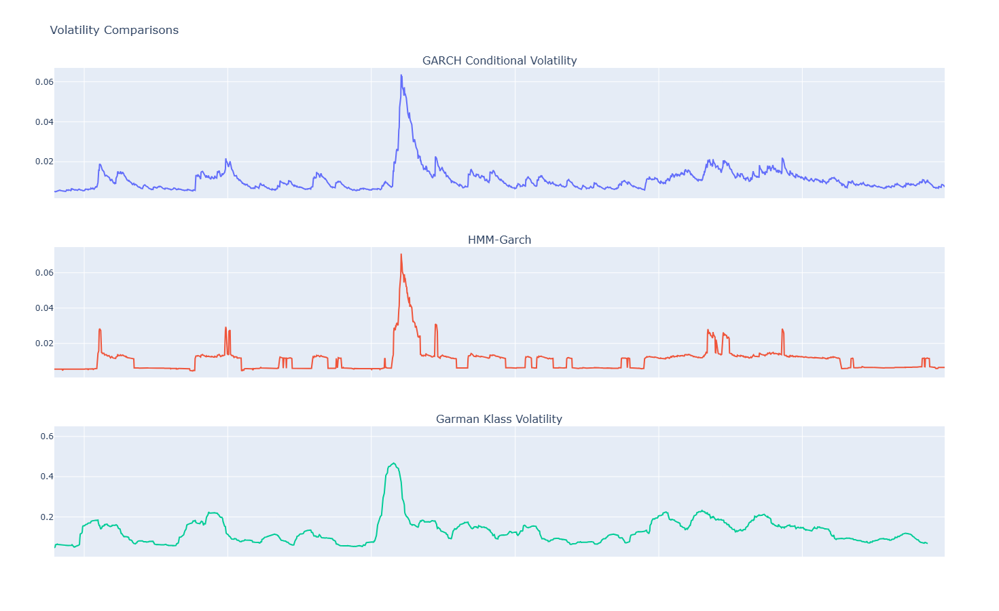

In [92]:
fig = make_subplots(rows = 3, cols = 1, shared_xaxes = True, vertical_spacing = 0.1, subplot_titles = ("GARCH Conditional Volatility", 'HMM-Garch', 'Garman Klass Volatility', 'Log Returns'))

plt_garch = go.Scatter(x = garch_garch_vol['Date'], y = garch_garch_vol['vol'], name = 'GARCH Conditional Volatility')
plt_hmm_garch = go.Scatter(x = hmm_garch_vol['Date'], y = hmm_garch_vol['vol'], name = 'HMM-GARCH')
plt_garman_klass = go.Scatter(x = spx['Date'], y = garman_klass_vol, name = 'Garman Klass Volatility')

fig.add_trace(plt_garch, row=1, col=1)
fig.add_trace(plt_hmm_garch, row=2, col=1)
fig.add_trace(plt_garman_klass, row = 3, col = 1)

fig.update_xaxes(range=[hmm_garch_vol['Date'].min(), hmm_garch_vol['Date'].max()], row=1, col=1)
fig.update_xaxes(range=[hmm_garch_vol['Date'].min(), hmm_garch_vol['Date'].max()], row=3, col=1)
fig.update_xaxes(title_text = 'Date', row=3, col=1)

fig.update_layout(height = 900, title_text = "Volatility Comparisons", showlegend = False, hovermode = "x unified")
fig.update_traces(xaxis='x1')
fig.show()

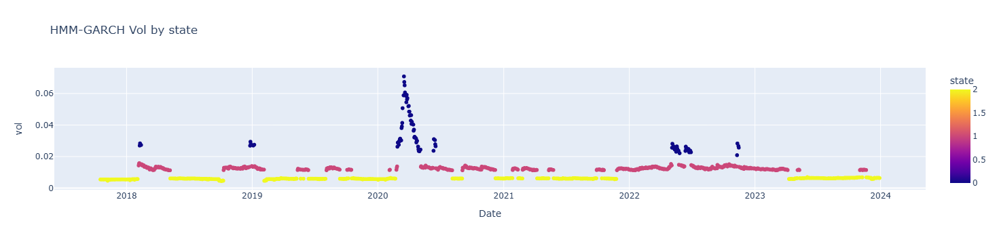

In [134]:
fig = px.scatter(hmm_garch_vol, x="Date", y="vol", color="state",
                 title="HMM-GARCH Vol by state")

fig.show()

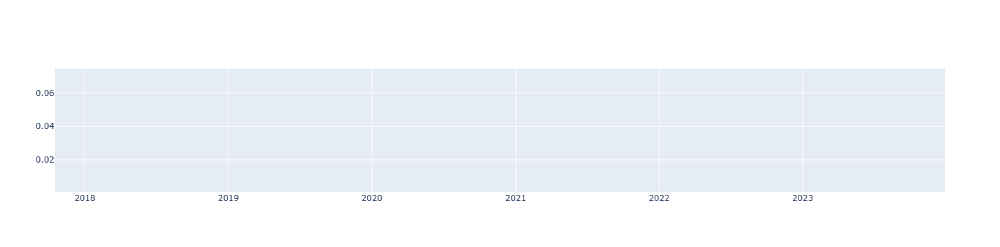

In [139]:
# create base figure
fig = go.Figure()

# add traces (line segments)
for row in hmm_garch_vol.rows(named = True):
    row = pl.DataFrame(row)
    fig.add_trace(
        go.Scatter(
            x=row['Date'],
            y=row['vol'], 
            mode='lines',
            line={'color' : row['color'].item()}
        )
    )
    
fig.update_layout(showlegend=False)

In [46]:
mod_hamilton = sm.tsa.MarkovAutoregression(train_ret['log_ret'].abs().to_numpy()-train_ret['log_ret'].abs().to_numpy().mean(), k_regimes=3, order = 1, trend="n", switching_ar = False, switching_variance = True)
    
res_hamilton = mod_hamilton.fit()
res_hamilton.summary()

C:\Users\limje\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



<class 'statsmodels.iolib.summary.Summary'>
"""
                         Markov Switching Model Results                         
================================================================================
Dep. Variable:                        y   No. Observations:                 6242
Model:             MarkovAutoregression   Log Likelihood               22575.745
Date:                  Wed, 06 Nov 2024   AIC                         -45131.490
Time:                          15:04:34   BIC                         -45064.099
Sample:                               0   HQIC                        -45108.134
                                 - 6242                                         
Covariance Type:                 approx                                         
                             Regime 0 parameters                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      9.957e-05   7.83e-06     12.713      0.000    8.42e-05       0.000
                             Regime 1 parameters                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      2.504e-05   6.44e-07     38.910      0.000    2.38e-05    2.63e-05
                             Regime 2 parameters                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2         0.0008      0.000      7.312      0.000       0.001       0.001
                           Non-switching parameters                           
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2014      0.013     15.107      0.000       0.175       0.228
                         Regime transition parameters                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
p[0->0]        0.9627      0.007    130.247      0.000       0.948       0.977
p[1->0]        0.0081      0.002      4.038      0.000       0.004       0.012
p[2->0]        0.0831      0.030      2.735      0.006       0.024       0.143
p[0->1]        0.0279      0.007      4.035      0.000       0.014       0.041
p[1->1]        0.9911      0.002    538.933      0.000       0.987       0.995
p[2->1]     7.899e-06      0.038      0.000      1.000      -0.075       0.075
==============================================================================

Warnings:
[1] Covariance matrix calculated using numerical (complex-step) differentiation.
"""